<div style="display: flex; background-color: RGB(255,114,0);" >

# PROJET - Bonheur World <mark>Exploration des données et nettoyage</mark>
</div>

<div style="display: flex; background-color: Blue; padding: 15px;" >

## 1.Mission 
</div>

<div style="display: flex; background-color: Green; padding: 7px;" >

### 1.1. Rappel sur sujet
</div>

Challenge goals

How accurately can we predict regional temperature anomalies based on past and neighbouring climate observations ?

Dans cette étude de cas, nous formerons un algorithme d'apprentissage automatique non supervisé pour regrouper les pays en fonction de caractéristiques telles que la production économique, le soutien social, l'espérance de vie, la liberté, l'absence de corruption et la générosité. Le Rapport sur le bonheur dans le monde détermine l'état du bonheur mondial. Les scores de bonheur et les données de classement ont été collectés en demandant aux individus de classer leur vie de 0 (la pire vie possible) à 10 (la meilleure vie possible).         

- Un notebook contenant les fonctions permettant le prétraitement des données ainsi que les résultats du clustering (en y incluant des représentations graphiques) ....
- Un support de présentation qui présente la démarche et les résultats du clustering.

<div style="display: flex; background-color: Green; padding: 7px;" >

### 1.2. Description du notebook
</div>

Ce note book, a pour objectif d'explorer les données et d'effectuer le nettoyage.

<div style="display: flex; background-color: Green; padding: 7px;" >

### 1.3. Description des données
</div>



|column        | Description                             |
|--------------| --------------------------------------- |
|country_official | nom officiel du pays |
|country | nom du pays reçu à l'origine|
|year | année|
|score | score du bonheur|
|PIB | PIB par habitant|
|Soutien | Soutien social|
|Esperance vie BS | Espérance de vie en Bonne Santé|
|Liberte des choix de vie | |
|Generosite | la générosité perçue|
|Corruption | le faible niveau de corruption perçue|
|Regional indicator||
|id_country | identifiant officiel du pays|
|alpha3 | code alpha3 officiel du pays|
|alpha2 | code alpha2 officiel du pays|
|continent_code | code continent officiel du pays|
|latitude | latitude du pays|
|longitude | longitude du pay|s
|Annual Sunshine | durée d'ensoleillement du pays|
|Annual Sunshine NCDC Computed||
|deaths_rural_urban | nombre de morts en zone urbaine|
|divorces | nombre de divorce|
|Precipitations in million cubic metres | volume de précipitations|
|rate of Population connected to wastewater collecting system | ratio de la population avec l'eau courante|
|rate of Population connected to wastewater treatment | ratio de la population connectée au tout à l'égout|
|gini | indice de gini|
|intentional homicide victims Female nb | nombre de femmes victimes d'homicide |
|intentional homicide victims Male nb | nombre d'hommes victimes d'homicide |
|Homicide victime nb | nombre de victimes d'homicide |


In [1]:
from os import getcwd
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
from tqdm import tqdm
import csv
from bonheur_bed_ara import *
from IPython.core.display import HTML
import plotly.express as px
import plotly.graph_objs as go

<div style="display: flex; background-color: Blue; padding: 15px;" >

## 2.Chargement des données
</div>

In [2]:
# ---------------------------------------------------------------------------------------------
#                               MAIN
# ---------------------------------------------------------------------------------------------
verbose = 0

# Récupère le répertoire du programme
file_path = getcwd() + "\\"
data_set_path = file_path + "dataset\\"
country_col_name = "country"
country_official_col_name = "country_official"
country_official_France = 'French Republic'

data_set_file_name = "DATA_SET_FULL.csv"

print(f"Current execution path : {file_path}")
print(f"Dataset path : {data_set_path}")

Current execution path : c:\Users\User\WORK\workspace-ia\PROJETS\projet_bonheur_bed\
Dataset path : c:\Users\User\WORK\workspace-ia\PROJETS\projet_bonheur_bed\dataset\


<div style="display: flex; background-color: Green; padding: 7px;" >

### 2.1. Chargement
</div>

Le code continent `NA` pour `North America` est interprété comme un NAN, il faut donc en tenir compte au chargement des données.

In [3]:
# Le code continent North American = NA était interprété en tant que NaN et non sa valeur
df_origin = pd.read_csv(data_set_path+data_set_file_name, quoting=csv.QUOTE_NONNUMERIC, na_values=["", np.nan], keep_default_na=False, sep=',')
df_origin = df_origin.sort_values(by=[country_official_col_name, "year"])

print(f"{df_origin.shape} données chargées ------> {list(df_origin.columns)}")
df_origin.head()

(2359, 28) données chargées ------> ['country_official', 'country', 'year', 'score', 'PIB', 'Soutien', 'Esperance vie BS', 'Liberte des choix de vie', 'Generosite', 'Corruption', 'Regional indicator', 'id_country', 'alpha3', 'alpha2', 'continent_code', 'latitude', 'longitude', 'Annual Sunshine', 'Annual Sunshine NCDC Computed', 'deaths_rural_urban', 'divorces', 'Precipitations in million cubic metres', 'rate of Population connected to wastewater collecting system', 'rate of Population connected to wastewater treatment', 'gini', 'intentional homicide victims Female nb', 'intentional homicide victims Male nb', 'Homicide victime nb']


,country_official,country,year,score,PIB,Soutien,Esperance vie BS,Liberte des choix de vie,Generosite,Corruption,...,Annual Sunshine NCDC Computed,deaths_rural_urban,divorces,Precipitations in million cubic metres,rate of Population connected to wastewater collecting system,rate of Population connected to wastewater treatment,gini,intentional homicide victims Female nb,intentional homicide victims Male nb,Homicide victime nb
443,Arab Republic of Egypt,Egypt,2005.0,5.168,9.036,0.848,59.70,0.817,NaN,NaN,...,3293.3,450646.0,65047.0,1300.0,NaN,NaN,NaN,63.0,459.0,10962.0
828,Arab Republic of Egypt,Egypt,2007.0,5.541,9.135,0.686,59.82,0.609,-0.121,NaN,...,3790.8,450596.0,77878.0,1300.0,NaN,NaN,NaN,163.0,517.0,14280.0
1082,Arab Republic of Egypt,Egypt,2008.0,4.632,9.186,0.738,59.88,NaN,-0.087,0.914,...,3790.8,461934.0,84430.0,NaN,NaN,NaN,NaN,110.0,856.0,20286.0
936,Arab Republic of Egypt,Egypt,2009.0,5.066,9.213,0.744,59.94,0.611,-0.100,0.801,...,3298.9,476592.0,141467.0,NaN,NaN,NaN,NaN,193.0,719.0,19152.0
961,Arab Republic of Egypt,Egypt,2010.0,4.669,9.244,0.769,60.00,0.486,-0.076,0.826,...,3666.4,483385.0,149376.0,NaN,NaN,NaN,NaN,197.0,1642.0,38619.0


<div style="display: flex; background-color: Green; padding: 7px;" >

### 2.2. Exploration de la forme
</div>

In [4]:
df_origin[df_origin['continent_code'].isna()]

,country_official,country,year,score,PIB,Soutien,Esperance vie BS,Liberte des choix de vie,Generosite,Corruption,...,Annual Sunshine NCDC Computed,deaths_rural_urban,divorces,Precipitations in million cubic metres,rate of Population connected to wastewater collecting system,rate of Population connected to wastewater treatment,gini,intentional homicide victims Female nb,intentional homicide victims Male nb,Homicide victime nb


In [5]:
df = df_origin.copy()

In [6]:
df.duplicated(subset=['country_official', 'year']).sum()

0

<div style="display: flex; background-color: indigo;" >

#### Encodage des continents
</div>

In [7]:
# Encodage des continents :
from sklearn.preprocessing import LabelEncoder

In [8]:
transformer_continent = LabelEncoder()
df['continent_encode'] = transformer_continent.fit_transform(df['continent_code'])
df = df[['country_official', 'country', 'continent_code','continent_encode','year', 'score', 'PIB', 'Soutien',
       'Esperance vie BS', 'Liberte des choix de vie', 'Generosite',
       'Corruption', 'Regional indicator', 'alpha3', 'alpha2', 'latitude', 'longitude', 'id_country', 'Annual Sunshine',
       'Annual Sunshine NCDC Computed', 'deaths_rural_urban', 'divorces',
       'Precipitations in million cubic metres',
       'rate of Population connected to wastewater collecting system',
       'rate of Population connected to wastewater treatment', 'gini',
       'intentional homicide victims Female nb',
       'intentional homicide victims Male nb', 'Homicide victime nb'
       ]]

<div style="display: flex; background-color: indigo;" >

#### Typage des données
</div>

In [9]:
df["year"] = df["year"].astype(int)
df["id_country"] = df["id_country"].astype(int)

In [10]:
df.dtypes

country_official                                                 object
country                                                          object
continent_code                                                   object
continent_encode                                                  int32
year                                                              int32
score                                                           float64
PIB                                                             float64
Soutien                                                         float64
Esperance vie BS                                                float64
Liberte des choix de vie                                        float64
Generosite                                                      float64
Corruption                                                      float64
Regional indicator                                               object
alpha3                                                          

In [11]:
annee_min = df["year"].min()
annee_max = df["year"].max()
print(f"Données de {annee_min} à {annee_max}")

Données de 2005 à 2022


<div style="display: flex; background-color: indigo;" >

#### Correction des données du la Suède
</div>

Suite à la l'analyse de l'évolution des scores pour le top des pays, on constate une anomalie dans les données de la Suède.

In [12]:
country_name = "Kingdom of Sweden"
df[(df['country_official']==country_name) & ((df['year']==2020) | (df['year']==2021))]

,country_official,country,continent_code,continent_encode,year,score,PIB,Soutien,Esperance vie BS,Liberte des choix de vie,...,Annual Sunshine NCDC Computed,deaths_rural_urban,divorces,Precipitations in million cubic metres,rate of Population connected to wastewater collecting system,rate of Population connected to wastewater treatment,gini,intentional homicide victims Female nb,intentional homicide victims Male nb,Homicide victime nb
953,Kingdom of Sweden,Swaziland,EU,2,2020,4.308,9.163,0.77,51.188,0.647,...,1801.0,98124.0,NaN,NaN,NaN,NaN,NaN,25.0,99.0,2604.0
1694,Kingdom of Sweden,Swaziland,EU,2,2021,4.308,9.065,0.77,50.833,0.647,...,1803.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
# Correction de la valeur de la Suède
# Pour 2020 = récupération du score sur internet
df.loc[(df['country_official']==country_name) & (df['year']==2020), 'score'] = 7.353
# Pour 2021 = La moyenne entre 2020 et 2022
df.loc[(df['country_official']==country_name) & (df['year']==2021), 'score'] = np.mean(df.loc[(df['country_official']==country_name) & ((df['year']==2020) | (df['year']==2022)), 'score'].values)
df[(df['country_official']==country_name) & ((df['year']==2020) | (df['year']==2021))]

,country_official,country,continent_code,continent_encode,year,score,PIB,Soutien,Esperance vie BS,Liberte des choix de vie,...,Annual Sunshine NCDC Computed,deaths_rural_urban,divorces,Precipitations in million cubic metres,rate of Population connected to wastewater collecting system,rate of Population connected to wastewater treatment,gini,intentional homicide victims Female nb,intentional homicide victims Male nb,Homicide victime nb
953,Kingdom of Sweden,Swaziland,EU,2,2020,7.3530,9.163,0.77,51.188,0.647,...,1801.0,98124.0,NaN,NaN,NaN,NaN,NaN,25.0,99.0,2604.0
1694,Kingdom of Sweden,Swaziland,EU,2,2021,7.3685,9.065,0.77,50.833,0.647,...,1803.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<div style="display: flex; background-color: indigo;" >

#### Correction des données 2022
</div>

Après une première analyse suite à la visualisation des outliers, les données complémentaires de 2022 ont changées, il ne s'agit pas de la valeur, mais du ratio d'impact de la variable sur le score, nous ne disposons donc pas des valeurs pour l'année 2022.

Suppression des valeurs complémentaires pour l'année 2022, à savoir les variables `'PIB', 'Soutien', 'Esperance vie BS',
       'Liberte des choix de vie', 'Generosite', 'Corruption'`

On applique cette correction dès le départ, car il y a un impact sur les analyses qui suivent

In [14]:
to_correct_colums = ['PIB', 'Soutien', 'Esperance vie BS', 'Liberte des choix de vie', 'Generosite', 'Corruption']
for c in to_correct_colums:
    df.loc[df["year"] == 2022, c] = np.nan

df.head()

,country_official,country,continent_code,continent_encode,year,score,PIB,Soutien,Esperance vie BS,Liberte des choix de vie,...,Annual Sunshine NCDC Computed,deaths_rural_urban,divorces,Precipitations in million cubic metres,rate of Population connected to wastewater collecting system,rate of Population connected to wastewater treatment,gini,intentional homicide victims Female nb,intentional homicide victims Male nb,Homicide victime nb
443,Arab Republic of Egypt,Egypt,AF,0,2005,5.168,9.036,0.848,59.70,0.817,...,3293.3,450646.0,65047.0,1300.0,NaN,NaN,NaN,63.0,459.0,10962.0
828,Arab Republic of Egypt,Egypt,AF,0,2007,5.541,9.135,0.686,59.82,0.609,...,3790.8,450596.0,77878.0,1300.0,NaN,NaN,NaN,163.0,517.0,14280.0
1082,Arab Republic of Egypt,Egypt,AF,0,2008,4.632,9.186,0.738,59.88,NaN,...,3790.8,461934.0,84430.0,NaN,NaN,NaN,NaN,110.0,856.0,20286.0
936,Arab Republic of Egypt,Egypt,AF,0,2009,5.066,9.213,0.744,59.94,0.611,...,3298.9,476592.0,141467.0,NaN,NaN,NaN,NaN,193.0,719.0,19152.0
961,Arab Republic of Egypt,Egypt,AF,0,2010,4.669,9.244,0.769,60.00,0.486,...,3666.4,483385.0,149376.0,NaN,NaN,NaN,NaN,197.0,1642.0,38619.0


<div style="display: flex; background-color: indigo;" >

#### Correction des données Mali ensoleillement 2021
</div>

Suite à l'analyse des outliers, il s'avère que la donnée "Ensoleillement" pour le Mali pour l'année 2021 est erronée.

Choix de l'imputation par la moyenne de l'année précédente et suivante.

In [15]:
# L'une des valeurs du Mali n'est pas cohérente pour l'ensoleillement, pour l'année 2021 : 298.7 alors que toutes les autres années sont autour entre 2800 et 3000
moyenne_20_22 = np.mean(df.loc[(df['country_official']=='Republic of Mali') & ((df['year']==2020) | (df['year']==2022)), 'Annual Sunshine NCDC Computed'].values)
df.loc[(df['country_official']=='Republic of Mali') & (df['year']==2021), 'Annual Sunshine NCDC Computed'] = moyenne_20_22
if verbose:
    print(f"MALI Sunshine > 2021 => {moyenne_20_22} ------------ IMPUTED")
df.loc[(df['country_official']=='Republic of Mali') & (df['year']==2021), 'Annual Sunshine NCDC Computed']

1892    2926.1
Name: Annual Sunshine NCDC Computed, dtype: float64

In [16]:
# Correction des données du Niger avec la moyenne des pays voisins sur la même latitude
for y in range(annee_min, annee_max+1):
    if verbose:
        print(f"NIGER Sunshine > {y} =", end="")
    moyenne_voisins = np.nan
    try:
        moyenne_voisins = np.mean(df.loc[((df['country_official']=='Republic of Mali') | (df['country_official']=='Republic of Chad')) & (df['year']==y), 'Annual Sunshine NCDC Computed'].values)
    except:
        moyenne_voisins = np.nan
    # On ne traite que les lignes déjà existantes
    if df[(df['country_official']=='Republic of the Niger') & (df['year']==y)].shape[0]>0:
        df.loc[(df['country_official']=='Republic of the Niger') & (df['year']==y), 'Annual Sunshine NCDC Computed' ] = moyenne_voisins
        if verbose:
            print(f"> {moyenne_voisins} ------------ IMPUTED")
    else:
        if verbose:
            print(f"> ------------ UNEXIST")
df[df['country_official']=='Republic of the Niger']

C:\Users\User\AppData\Roaming\Python\Python39\site-packages\numpy\core\fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\User\AppData\Roaming\Python\Python39\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


,country_official,country,continent_code,continent_encode,year,score,PIB,Soutien,Esperance vie BS,Liberte des choix de vie,...,Annual Sunshine NCDC Computed,deaths_rural_urban,divorces,Precipitations in million cubic metres,rate of Population connected to wastewater collecting system,rate of Population connected to wastewater treatment,gini,intentional homicide victims Female nb,intentional homicide victims Male nb,Homicide victime nb
1133,Republic of the Niger,Niger,AF,0,2006,3.737,6.888,0.677,46.36,0.750,...,3307.40,NaN,NaN,530492.87500,NaN,NaN,NaN,NaN,NaN,NaN
1009,Republic of the Niger,Niger,AF,0,2007,4.277,6.881,0.726,47.12,0.584,...,3500.90,NaN,NaN,532140.00000,NaN,NaN,37.3,NaN,NaN,NaN
1125,Republic of the Niger,Niger,AF,0,2008,4.236,6.918,0.607,47.88,0.649,...,3010.35,NaN,NaN,490432.65625,NaN,NaN,NaN,NaN,NaN,NaN
1143,Republic of the Niger,Niger,AF,0,2009,4.267,6.898,0.771,48.64,0.880,...,3303.70,NaN,NaN,443403.93750,NaN,NaN,NaN,NaN,NaN,NaN
1182,Republic of the Niger,Niger,AF,0,2010,4.101,6.941,0.655,49.40,0.817,...,3182.30,NaN,NaN,563043.31250,NaN,NaN,NaN,NaN,NaN,NaN
991,Republic of the Niger,Niger,AF,0,2011,4.556,6.925,0.818,49.92,0.780,...,2783.20,NaN,NaN,442390.31250,NaN,NaN,31.5,NaN,NaN,NaN
1214,Republic of the Niger,Niger,AF,0,2012,3.798,6.987,0.700,50.44,0.734,...,3172.20,NaN,NaN,604485.68750,NaN,NaN,NaN,NaN,NaN,NaN
1289,Republic of the Niger,Niger,AF,0,2013,3.716,7.002,0.696,50.96,0.825,...,2979.20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1144,Republic of the Niger,Niger,AF,0,2014,4.181,7.027,0.753,51.48,0.688,...,3303.70,NaN,NaN,NaN,NaN,NaN,34.3,NaN,NaN,NaN
1287,Republic of the Niger,Niger,AF,0,2015,3.671,7.030,0.713,52.00,0.728,...,2837.05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<div style="display: flex; background-color: indigo;" >

#### Correction des années d'ensoleillement manquantes
</div>

La première idée pour compléter les données était de faire la moyenne de l'année passée et suivante du même pays.

In [17]:
current_data_col_name = 'Annual Sunshine NCDC Computed'
before_na = df[current_data_col_name].isna().sum()
df[current_data_col_name] = df.apply(lambda x: get_year_data_mean(df, current_y=x["year"], current_country=x["country_official"], current_data_col_name=current_data_col_name, verbose=verbose), axis=1)
print(f"{before_na} NA before proceed and {df[current_data_col_name].isna().sum()} NA after proceed")

889 NA before proceed and 889 NA after proceed


Après analyse, les pays pour lesquels il manque des données (hors Niger traité précédement) n'ont pas de "trou" dans leurs données, soit la donnée est présente, soit elle est absente.

Pour compléter l'ensoleillement de manière automatique, l'idéal serait donc de récupérer les pays qui ont des données dont la latitude est la même par ordre de proximté en longitude également.

Ce qui permettrait de définir les pays voisins de chaque pays et donc de faire la moyenne d'ensoleillement des plus proches voisins.
Par manque de temps, ce traitement n'est pas réalisé.

<div style="display: flex; background-color: indigo;" >

#### Describe
</div>

In [18]:
df.describe(include="all")

,country_official,country,continent_code,continent_encode,year,score,PIB,Soutien,Esperance vie BS,Liberte des choix de vie,...,Annual Sunshine NCDC Computed,deaths_rural_urban,divorces,Precipitations in million cubic metres,rate of Population connected to wastewater collecting system,rate of Population connected to wastewater treatment,gini,intentional homicide victims Female nb,intentional homicide victims Male nb,Homicide victime nb
count,2359,2359,2359,2359.000000,2359.000000,2359.000000,2120.000000,2129.000000,2097.000000,2111.000000,...,1470.000000,1.035000e+03,9.460000e+02,5.340000e+02,461.000000,386.000000,841.000000,1063.000000,1057.000000,1.055000e+03
unique,164,190,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Arab Republic of Egypt,Egypt,AS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,17,17,707,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,1.518016,2014.507842,5.444851,9.349861,0.811119,63.394495,0.745412,...,2391.999354,3.624518e+05,7.289547e+04,7.909549e+05,66.355360,67.537196,36.906421,599.159925,2555.536424,6.635291e+04
std,NaN,NaN,NaN,1.384665,4.768411,1.122205,1.163141,0.119134,7.441898,0.140637,...,636.252758,1.180071e+06,2.678078e+05,2.366401e+06,25.828580,33.103334,7.890536,2207.075003,7445.275762,1.901684e+05
min,NaN,NaN,NaN,0.000000,2005.000000,2.375000,6.493000,0.290000,32.300000,0.258000,...,595.000000,1.216000e+03,4.200000e+01,1.540000e+01,4.900000,0.000000,24.000000,0.000000,0.000000,0.000000e+00
25%,NaN,NaN,NaN,0.000000,2011.000000,4.630000,8.445000,0.747000,58.640000,0.650000,...,1828.000000,2.878850e+04,5.162250e+03,3.251570e+04,51.040001,46.625000,30.900000,22.000000,45.000000,1.407000e+03
50%,NaN,NaN,NaN,1.000000,2015.000000,5.384000,9.456000,0.834000,65.200000,0.764000,...,2441.800000,8.087600e+04,1.310950e+04,1.010552e+05,69.800003,80.299999,35.400000,58.000000,162.000000,5.124000e+03
75%,NaN,NaN,NaN,2.000000,2019.000000,6.260000,10.339000,0.905000,68.520000,0.860000,...,2925.175000,2.579000e+05,3.583625e+04,3.659614e+05,87.000000,97.000000,42.000000,202.000000,752.000000,2.022300e+04


In [19]:
display(HTML(df[df["country_official"]==country_official_France].head().to_html()))

,country_official,country,continent_code,continent_encode,year,score,PIB,Soutien,Esperance vie BS,Liberte des choix de vie,Generosite,Corruption,Regional indicator,alpha3,alpha2,latitude,longitude,id_country,Annual Sunshine,Annual Sunshine NCDC Computed,deaths_rural_urban,divorces,Precipitations in million cubic metres,rate of Population connected to wastewater collecting system,rate of Population connected to wastewater treatment,gini,intentional homicide victims Female nb,intentional homicide victims Male nb,Homicide victime nb
185,French Republic,France,EU,2,2005,7.093,10.642,0.940,71.30,0.895,NaN,0.688,Western Europe,FRA,FR,46.71109,1.719104,250,1831.9,1831.8,527533.0,152020.0,401743.00000,NaN,NaN,29.8,NaN,NaN,NaN
630,French Republic,France,EU,2,2006,6.583,10.659,0.944,71.48,0.789,0.126,0.699,Western Europe,FRA,FR,46.71109,1.719104,250,1831.2,1831.2,516416.0,135910.0,509886.18750,NaN,NaN,29.7,NaN,NaN,NaN
628,French Republic,France,EU,2,2008,7.008,10.674,0.935,71.84,0.833,-0.031,0.669,Western Europe,FRA,FR,46.71109,1.719104,250,2835.5,2835.5,532131.0,129379.0,562079.68750,NaN,NaN,33.0,NaN,NaN,NaN
646,French Republic,France,EU,2,2009,6.283,10.639,0.918,72.02,0.798,-0.082,0.654,Western Europe,FRA,FR,46.71109,1.719104,250,1749.6,1749.7,538116.0,127578.0,474837.40625,NaN,NaN,32.7,NaN,NaN,NaN
298,French Republic,France,EU,2,2010,6.798,10.654,0.943,72.20,0.850,-0.104,0.623,Western Europe,FRA,FR,46.71109,1.719104,250,2737.3,2740.1,540469.0,130810.0,502397.18750,82.0,100.0,33.7,NaN,NaN,NaN


<div style="display: flex; background-color: Green; padding: 7px;" >

### 2.2. Visualisation générale
</div>

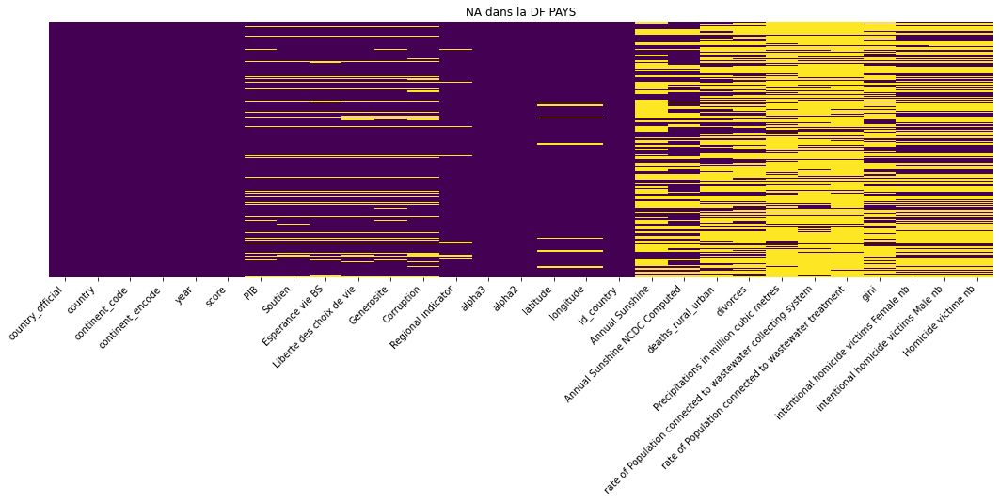

In [20]:
figure, ax = color_graph_background(1,1)
sns.heatmap(df.isnull(), yticklabels=False,cbar=False, cmap='viridis')
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.title("NA dans la DF PAYS")
figure.set_size_inches(18, 5, forward=True)
plt.show()

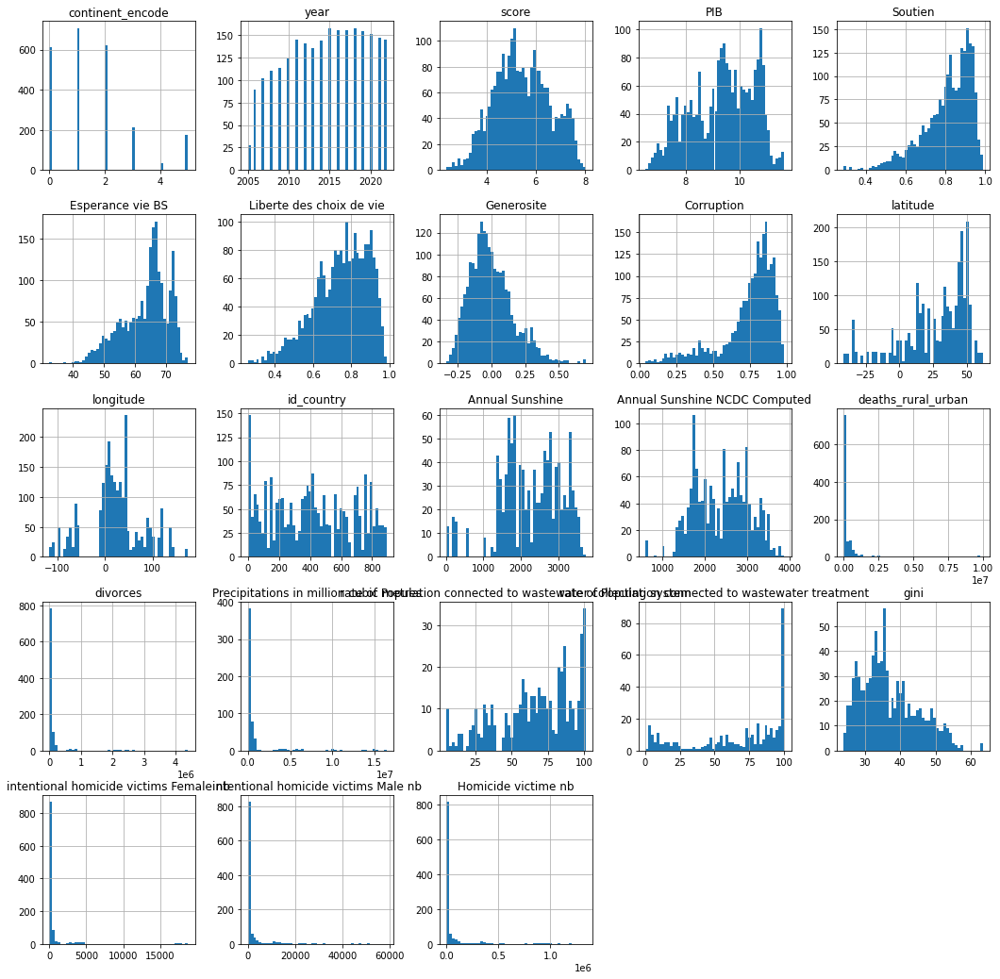

In [21]:
df.hist(figsize=(18,18),bins=50)
plt.show()

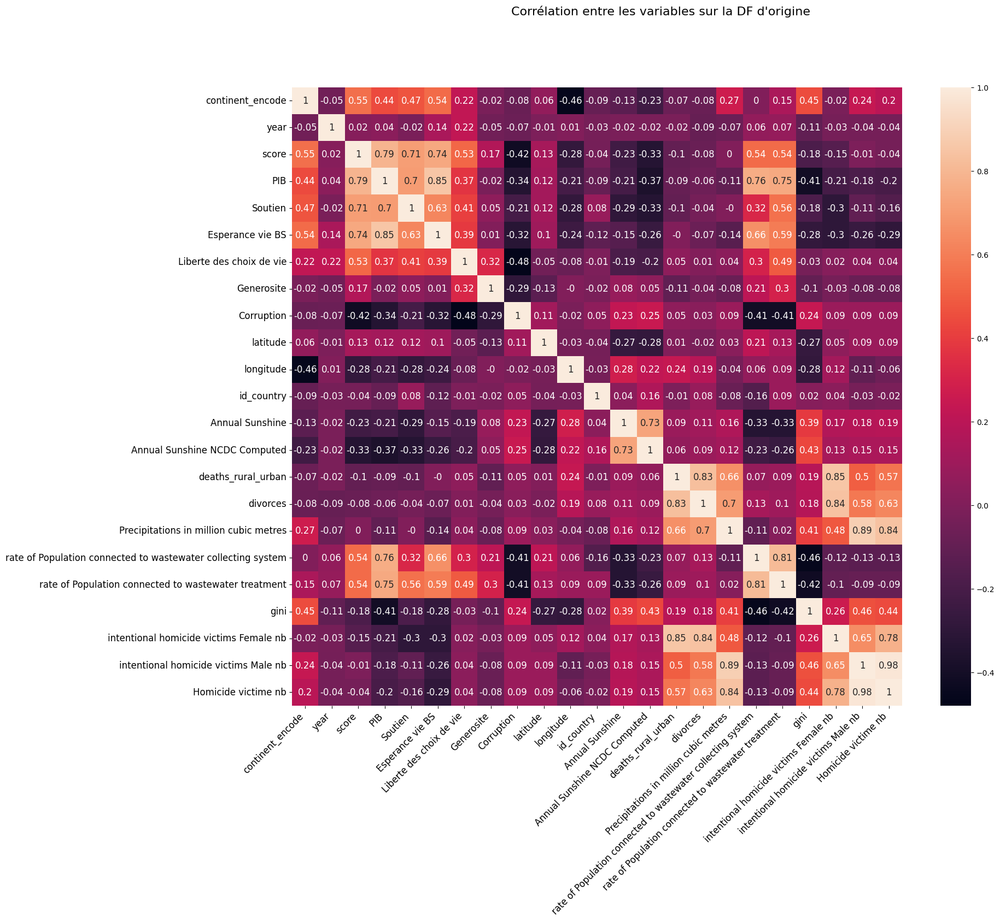

In [22]:
draw_correlation_graphe(df, "Corrélation entre les variables sur la DF d'origine", verbose=verbose,fontsize=12)

<div style="display: flex; background-color: Green; padding: 7px;" >

### 2.3. Analyse des corrélations
</div>

<div style="display: flex; background-color: indigo;" >

#### 2.3.1. Suppression des variables trop corrélées
</div>

Suite a une première analyse, les variables : 
- `Annual Sunshine` et `Annual Sunshine NCDC Computed` sont très fortement corrélée (0.84), une seule de ces 2 variables est donc suffisantes, suppression de `Annual Sunshine`
- `intentional homicide victims Male nb` et `intentional homicide victims Female nb`, `Homicide victime nb` sont très fortement corrélée (0.98), une seule de ces 2 variables est donc suffisantes, suppression de `intentional homicide victims Male nb` et de `intentional homicide victims Female nb`

In [23]:
df_clean = df.copy()
df_clean = df_clean.drop(['Annual Sunshine', 'intentional homicide victims Male nb', 'intentional homicide victims Female nb'], axis=1)
# renommage des variables qui ont un nom trop long
df_clean = df_clean.rename(columns={'Annual Sunshine NCDC Computed' : 'Annual Sunshine',
                                    'Precipitations in million cubic metres':'Precipitations M. m3'
                                    })

<div style="display: flex; background-color: indigo;" >

#### 2.3.2. Suppression des variables sans corrélation avec le score
</div>

D'après la heatmap de corrélation plusieurs variables n'ont pas d'intérêt par rapport au score.

- Il semblerait que la `météo` n'influence pas le bonheur (ensoleillement et précipitation), malgré le dictons que le soleil influence le moral. Même si lors de la corrélation avec les moyennes l'ensoleillement représente `-0.38` on peut émettre l'hypothèse que les pays affricains ont un fort niveau d'ensoleillement et un score plutôt bas.
- Contrairement à mon presentiment, l'indice de `GINI` n'influence pas non plus le score de bonheur alors que le PIB oui.
- la `latitude` et la `longitude` ne sont pas nécessaires car la situation géographique est déjà représentée par le continent
- le nombre de victimes d'homicides ne semble pas non plus avoir un impact sur le score de bonheur


In [24]:
print(df_clean.shape)
df_clean = df_clean.drop(['latitude', 'longitude',
       'id_country', 'Annual Sunshine', 'deaths_rural_urban', 'divorces',
       'Precipitations M. m3',
       'gini', 'Homicide victime nb'], axis=1)
print(df_clean.shape)

(2359, 26)
(2359, 17)


<div style="display: flex; background-color: Green; padding: 7px;" >

### 2.4. Complément des raccordements à l'eau et au traitement des eaux usées
</div>

Suite à une première analyse, on peut compléter les données sur les raccordements à l'eau et au traitement des eaux usées, en prenant comme hypothèse que la dernière année complétée permet de compléter les suivantes (hypothèse qu'il n'y a pas de diminution du nombre de personnes raccordées, mais au minimum un maintien sur les années suivantes quand il n'y a pas de valeur)

In [25]:
def complete_df_with_water_data(df_clean, verbose=0):
    col_names = ['rate of Population connected to wastewater collecting system', 'rate of Population connected to wastewater treatment']
    df_completed = df_clean.copy()

    i = 0

    for col_name in col_names:
        # Création de la DF temporaire avec la dernière valeur par pays
        df_temp_max = df_completed[df_completed[col_name].notna()]
        df_temp_max = df_temp_max.sort_values(by=["country_official","year"], ascending=False)
        df_temp_max = df_temp_max[[country_official_col_name, "year", col_name]]
        
        year_col_name = "year_max_"+str(i)
        df_temp_max = df_temp_max.rename(columns={"year": year_col_name, col_name : col_name+"_max"})
        # on ne garde que la dernière année
        df_temp_max = df_temp_max.drop_duplicates(subset=["country_official"], keep="first")

        # merge des 2 DF pour pouvoir compléter les données
        df_completed = df_completed.merge(df_temp_max, on=country_official_col_name, how="left", indicator=False)
        df_completed.loc[(df_completed[col_name].isna()) & (df_completed["year"]>df_completed[year_col_name]), col_name] = df_completed[col_name+"_max"]

        # Suppression des colonnes ajoutées
        df_completed = df_completed.drop(columns=[year_col_name, col_name+"_max"])
        # DF complétée
        if verbose:
            print(f"{col_name} : {df_clean[col_name].isna().sum()} NA BEFORE => {df_completed[col_name].isna().sum()} NA AFTER")
        i += 1
    return df_completed


In [26]:
df_completed = complete_df_with_water_data(df_clean, verbose=verbose)
df_completed.head()

,country_official,country,continent_code,continent_encode,year,score,PIB,Soutien,Esperance vie BS,Liberte des choix de vie,Generosite,Corruption,Regional indicator,alpha3,alpha2,rate of Population connected to wastewater collecting system,rate of Population connected to wastewater treatment
0,Arab Republic of Egypt,Egypt,AF,0,2005,5.168,9.036,0.848,59.70,0.817,NaN,NaN,Middle East and North Africa,EGY,EG,NaN,NaN
1,Arab Republic of Egypt,Egypt,AF,0,2007,5.541,9.135,0.686,59.82,0.609,-0.121,NaN,Middle East and North Africa,EGY,EG,NaN,NaN
2,Arab Republic of Egypt,Egypt,AF,0,2008,4.632,9.186,0.738,59.88,NaN,-0.087,0.914,Middle East and North Africa,EGY,EG,NaN,NaN
3,Arab Republic of Egypt,Egypt,AF,0,2009,5.066,9.213,0.744,59.94,0.611,-0.100,0.801,Middle East and North Africa,EGY,EG,NaN,NaN
4,Arab Republic of Egypt,Egypt,AF,0,2010,4.669,9.244,0.769,60.00,0.486,-0.076,0.826,Middle East and North Africa,EGY,EG,NaN,NaN


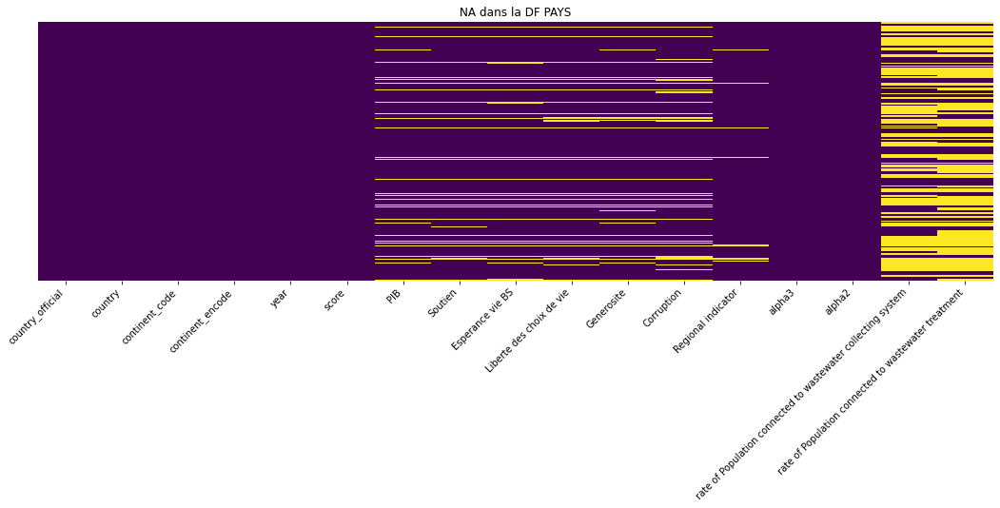

In [27]:
figure, ax = color_graph_background(1,1)
sns.heatmap(df_completed.isnull(), yticklabels=False,cbar=False, cmap='viridis')
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.title("NA dans la DF PAYS")
figure.set_size_inches(18, 5, forward=True)
plt.show()

<div style="display: flex; background-color: Green; padding: 7px;" >

### 2.5. Création de la DF avec les moyennes par pays
</div>

In [28]:
group_cols = ['country_official', 'continent_code', 'alpha3', 'alpha2']
un_means_col = ['continent_encode', 'year']

mean_cols1 = get_numeric_columns_names(df_completed, verbose=verbose)
mean_cols = [c for c in mean_cols1 if c not in un_means_col]

if verbose:
   print(f"mean_cols : {mean_cols}")

mean_dic = {}
for c in mean_cols:
   if c not in group_cols:
      mean_dic[c] = ['mean']

if verbose:
   print(f"group_cols : {group_cols}")
   
df_mean = df_completed.groupby(group_cols, as_index=False).agg(mean_dic)
df_mean = df_mean.droplevel(1, axis=1) 
df_mean = df_mean.sort_values(by=['score'], ascending=False)
df_mean = df_mean.reset_index()
df_mean = df_mean.drop("index", axis=1)
print(df_mean.shape)
df_mean.head()

(164, 13)


,country_official,continent_code,alpha3,alpha2,score,PIB,Soutien,Esperance vie BS,Liberte des choix de vie,Generosite,Corruption,rate of Population connected to wastewater collecting system,rate of Population connected to wastewater treatment
0,Kingdom of Denmark,EU,DNK,DK,7.681941,10.874063,0.957500,71.227688,0.945937,0.162467,0.196250,90.800000,100.014285
1,Republic of Finland,EU,FIN,FI,7.623067,10.743786,0.948786,71.224357,0.939429,-0.000071,0.246714,83.000000,100.000000
2,Swiss Confederation,EU,CHE,CH,7.551500,11.088182,0.943182,73.376545,0.924545,0.114455,0.306818,NaN,NaN
3,Kingdom of Norway,EU,NOR,NO,7.506583,11.044545,0.950455,72.709182,0.954091,0.137636,0.336727,85.658331,98.175001
4,Republic of Iceland,EU,ISL,IS,7.464273,10.856889,0.977222,72.880000,0.934111,0.256750,0.705444,92.000000,100.000000


In [29]:
df_completed = process_one_hot(df_completed, col="continent_code", verbose=verbose)
df_completed

,country_official,country,continent_code,continent_encode,year,score,PIB,Soutien,Esperance vie BS,Liberte des choix de vie,...,alpha3,alpha2,rate of Population connected to wastewater collecting system,rate of Population connected to wastewater treatment,continent_code_AF,continent_code_AS,continent_code_EU,continent_code_NA,continent_code_OC,continent_code_SA
0,Arab Republic of Egypt,Egypt,AF,0,2005,5.168,9.036,0.848,59.70,0.817,...,EGY,EG,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0
1,Arab Republic of Egypt,Egypt,AF,0,2007,5.541,9.135,0.686,59.82,0.609,...,EGY,EG,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0
2,Arab Republic of Egypt,Egypt,AF,0,2008,4.632,9.186,0.738,59.88,NaN,...,EGY,EG,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0
3,Arab Republic of Egypt,Egypt,AF,0,2009,5.066,9.213,0.744,59.94,0.611,...,EGY,EG,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0
4,Arab Republic of Egypt,Egypt,AF,0,2010,4.669,9.244,0.769,60.00,0.486,...,EGY,EG,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2354,the State of Palestine,Palestinian Territories,AS,1,2018,4.554,NaN,0.819,NaN,0.655,...,PSE,PS,53.900002,NaN,0.0,1.0,0.0,0.0,0.0,0.0
2355,the State of Palestine,Palestinian Territories,AS,1,2019,4.483,NaN,0.833,NaN,0.653,...,PSE,PS,53.900002,NaN,0.0,1.0,0.0,0.0,0.0,0.0
2356,the State of Palestine,Palestinian Territories,AS,1,2020,4.553,8.389,0.825,62.25,0.646,...,PSE,PS,53.900002,NaN,0.0,1.0,0.0,0.0,0.0,0.0
2357,the State of Palestine,Palestinian Territories,AS,1,2021,4.517,8.485,0.826,62.25,0.653,...,PSE,PS,53.900002,NaN,0.0,1.0,0.0,0.0,0.0,0.0


<div style="display: flex; background-color: Blue; padding: 15px;" >

## 3.Exploration des données
</div>

<div style="display: flex; background-color: Green; padding: 7px;" >

### 3.1. Exploration générale
</div>

<div style="display: flex; background-color: indigo;" >

#### 3.1.1. Visualisation des outliers
</div>

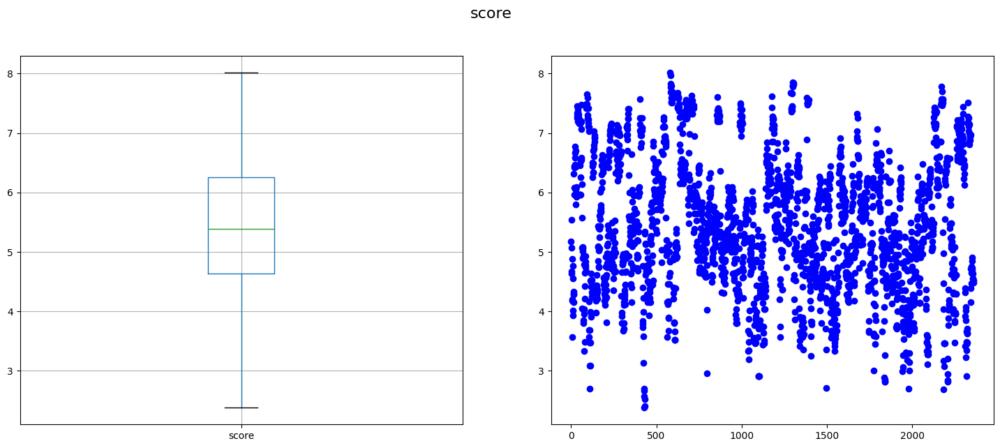

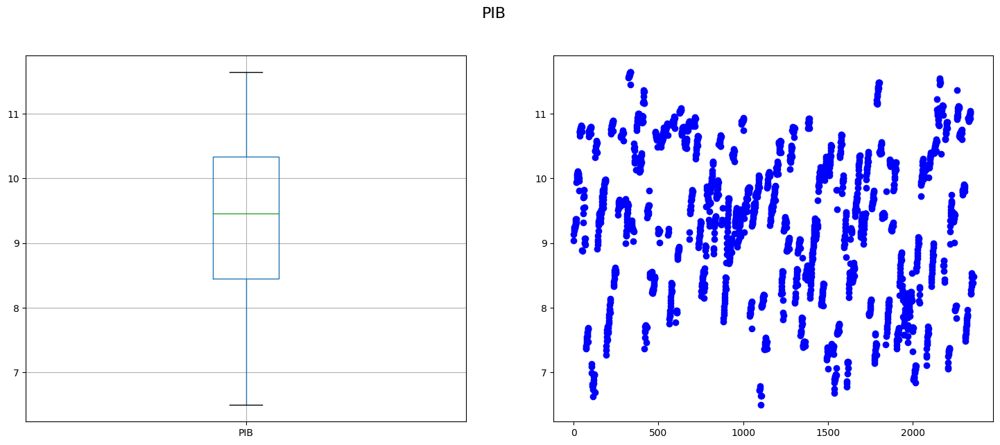

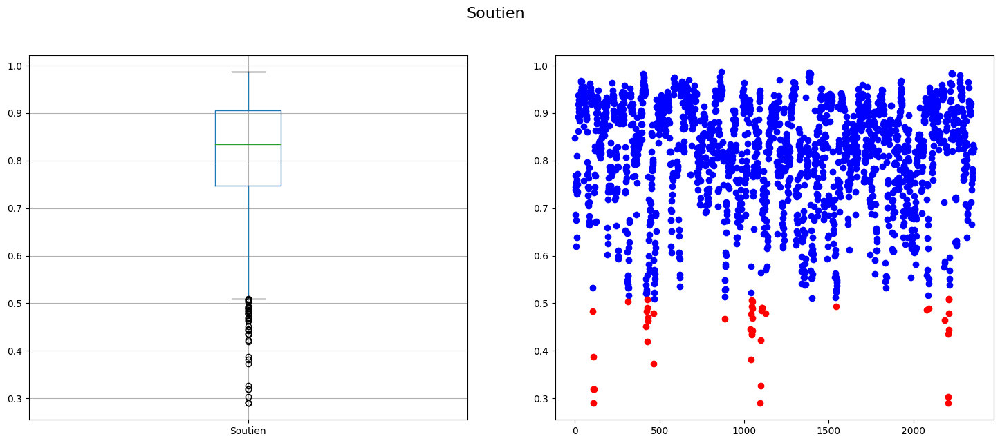

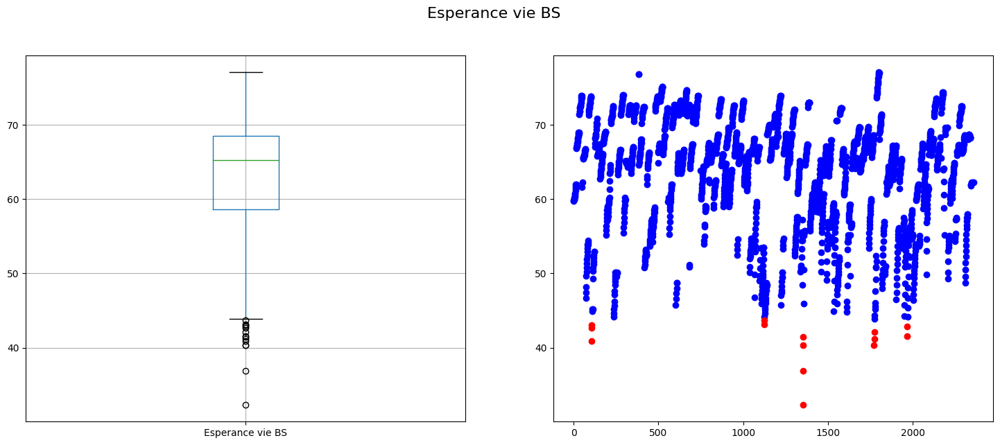

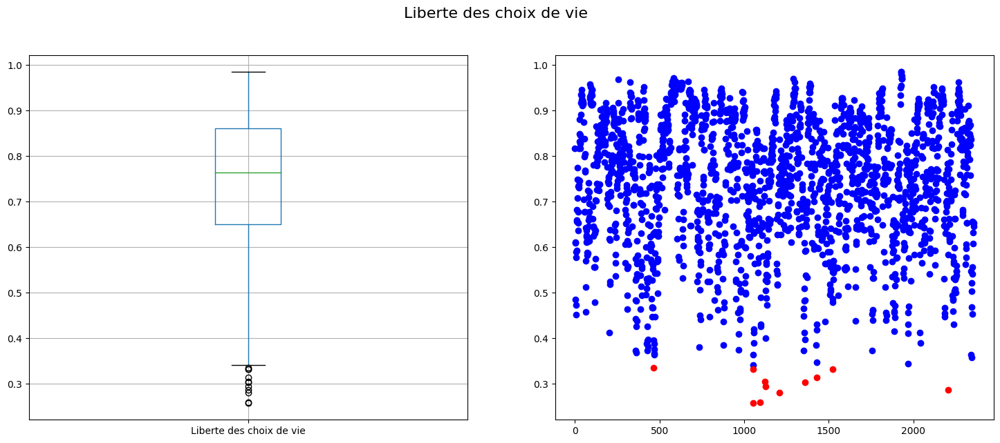

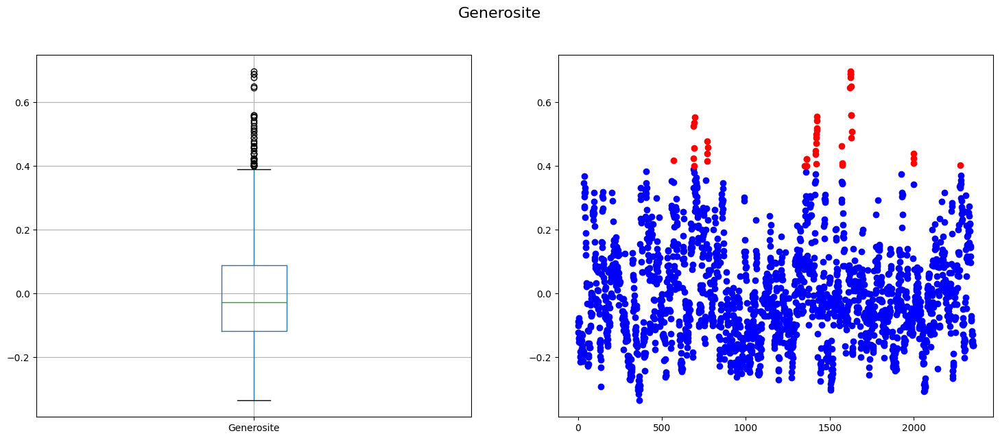

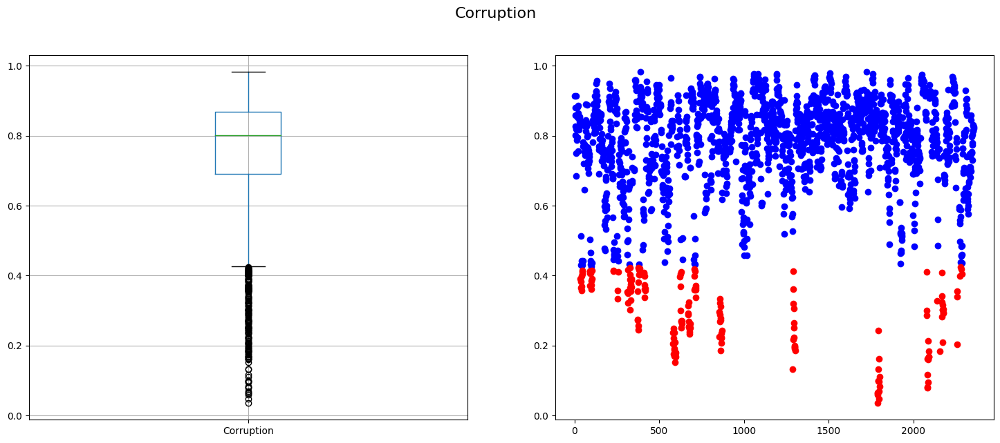

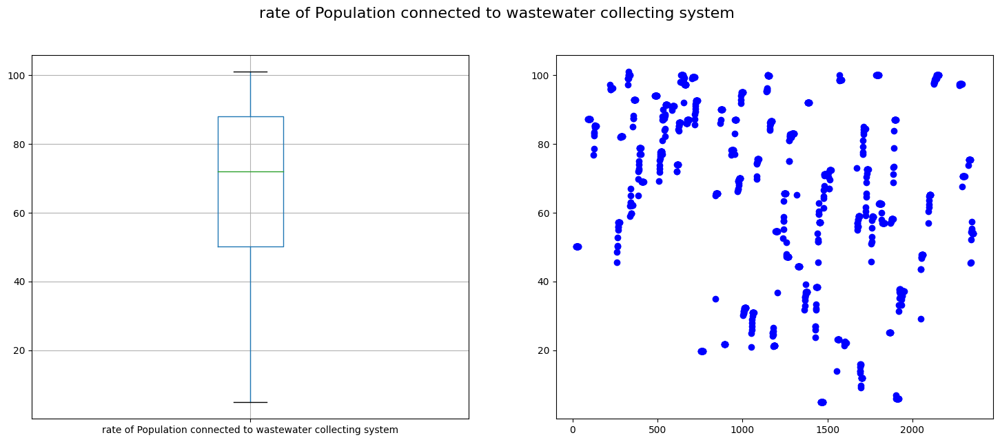

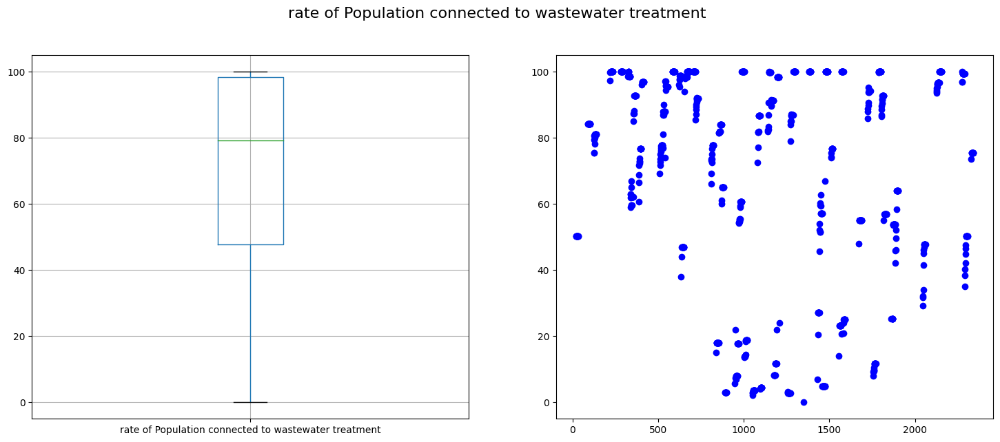

In [30]:
cols = get_numeric_columns_names(df_completed)
to_remove = ['year', 'continent_encode', 'continent_code_AF', 'continent_code_AS',
       'continent_code_EU', 'continent_code_NA', 'continent_code_OC','continent_code_SA']
for c in to_remove:
    cols.remove(c)

for column_name in cols:
    q_low, q_hi,iqr, q_min, q_max = get_outliers_datas(df_completed, column_name)
    graphe_outliers(df_completed, column_name, q_min, q_max)

Suite à une première analyse, certaines données ont été identifiées comme incohérentes :
- `espérence de vie BS` = 0 pour 2022 => les données complémentaires au score pour 2022 sont la part de la données dans le score, et non la valeur de la variable, remplacement par NaN pour 2022
- `espérence de vie BS` < 40 à Haiti en 2010 et 2011 : 
   > - Séisme de 2010 à Haïti : Le 12 janvier 2010, à 16h53, un séisme de magnitude 7 ébranle la capitale haïtienne Port-au-Prince. La secousse a duré moins de 30 secondes mais la ville n'est plus qu'un amas de ruines. Des centaines de corps gisent dans les rues.
- `espérence de vie BS` < 45 
   - à Nigeria en 2006 et 2007 :
     > - Crash d'avion fin 2005
     > - La guerre : Nigerian troops begin to pull out of Bakassi; Bakassi becomes Cameroonian territory.
     > - Terrorisme et délinquance : A pipeline explosion on the outskirts of Lagos kills about 100 people. 
     > - Chômage : The Nigerian government announces it will lay off one in five civil servants, amounting to over 33,000 jobs 
   - à Zambie en 2006 :
     > - Crash d'avion en 2005 : 13 officiers tués dans le crash d'un avion militaire
     > - Élection présidentielle zambienne de 2006
     > - 2005 February - Supreme Court rejects opposition challenge to President Mwanawasa's 2001 election victory, but says ballot had flaws.
     > - 2005 April - World Bank approves $3.8 billion debt relief package which will write off more than 50% of Zambia's debt.
     > - Around 50 workers killed in explosion at Chinese-owned explosives factory.
     > - 2005 November - President Mwanawasa declares a national disaster and appeals for food aid. He says more than a million Zambians face food shortages owing to drought.
     > - 2006 April - President Mwanawasa suffers a minor stroke. He resumes "light duties" after some weeks and later declares himself fit to run for re-election towards the end of the year.
     > - 2006 September - President Mwanawasa wins a second term.
     > - 2006 October - President announces discovery of oil in the west. 
   - à Chad en 2008 :
     > - Guerre 
   
- L'indice de `Gini` > 60 : seul 'Republic of South Africa' est concerné => gardé
- `Soutien` < 0.52 : 13 pays concernés de 2 continents (AF, AS) sur 16 années => semble cohérent
- `Liberte des choix de vie` :
  - Pakistan 2008 (pour 2007) :
     > - A state of emergency was declared by President of Pakistan Pervez Musharraf on 3 November 2007 and lasted until 15 December 2007, during which the constitution of Pakistan was suspended. When the state of emergency was declared, Musharraf controversially held both positions of President and Chief of Army Staff.
  - Bosnia and Herzegovina 2007 / 2009 / 2011 :
     > - Terrorisme
     > - Guerre
     > - 2010 : jugement des crimes de guerre / 'Corpses of more than 50 people are unearthed in Perućac lake on the border between Bosnia and Herzegovina and Serbia by investigators looking for people who were killed during the Bosnian War.'
  - Burundi : 2008
     > - The Burundian Civil War was a civil war in Burundi lasting from 1993 to 2005.
     > - De 2005 à 2008 : traitement des suites de la guerre
     > - 2009 : Période de paix
  - Cuba : 2006
     > - 2005 : Around 200 dissidents hold a public meeting, which its organizers call the first such gathering since the 1959 revolution.
     > - 2005 : Hurricane Dennis causes widespread destruction in Cuba and leaves 16 people dead. 
- `Annual Sunshine NCDC Computed`
  - L'une des valeurs du Mali n'est pas cohérente pour l'ensoleillement, pour l'année 2021 : 298.7 alors que toutes les autres années sont autour entre 2800 et 3000 => correction en mettant la moyenne de l'année précédente et de l'année suivante
  - Niger 2006, 2009, 2012, 2022 < 10 : les données sont erronées. Le Niger est entre le Mali et le Tchad, donc décision d'imputer l'ensoleillement avec la moyenne des valeurs de ces 2 pays par année.

<div style="display: flex; background-color: indigo;" >

#### 3.1.2. Histogrammes de la DF
</div>

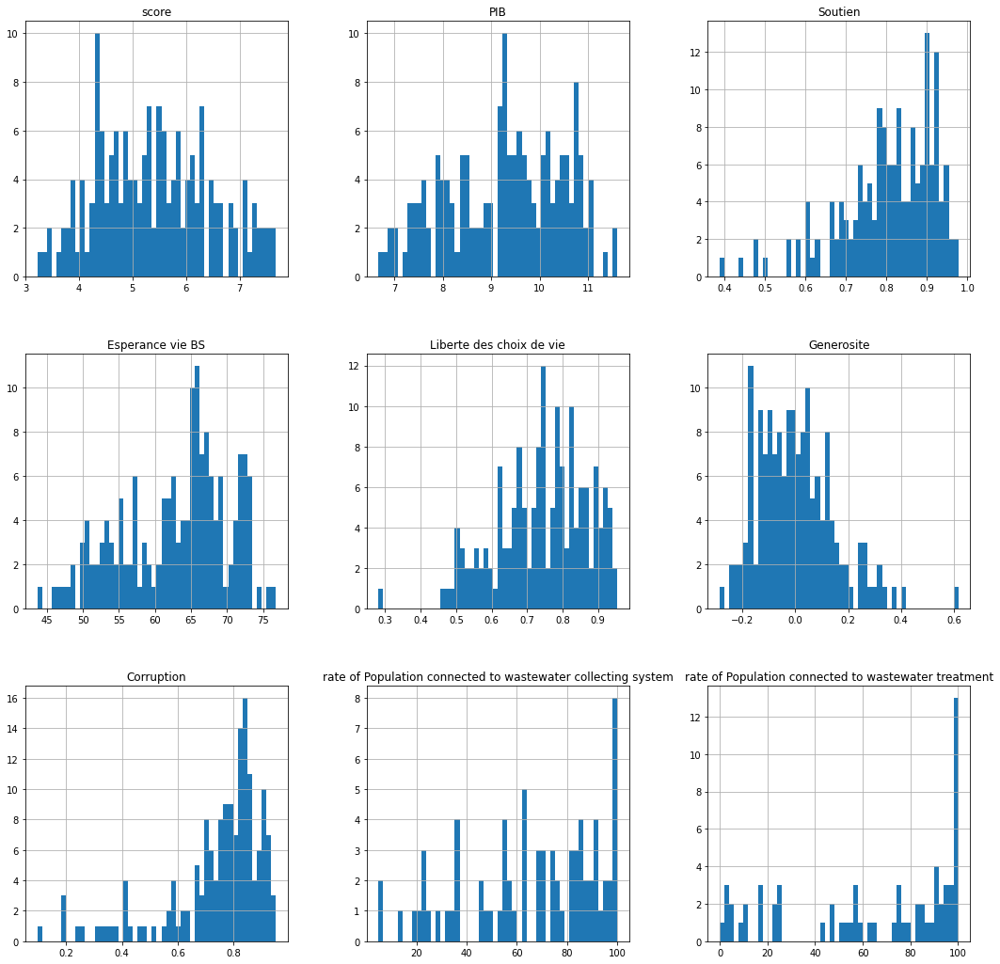

In [31]:
df_mean.hist(figsize=(18,18),bins=50)
figure.set_size_inches(18, 15, forward=True)
plt.show()

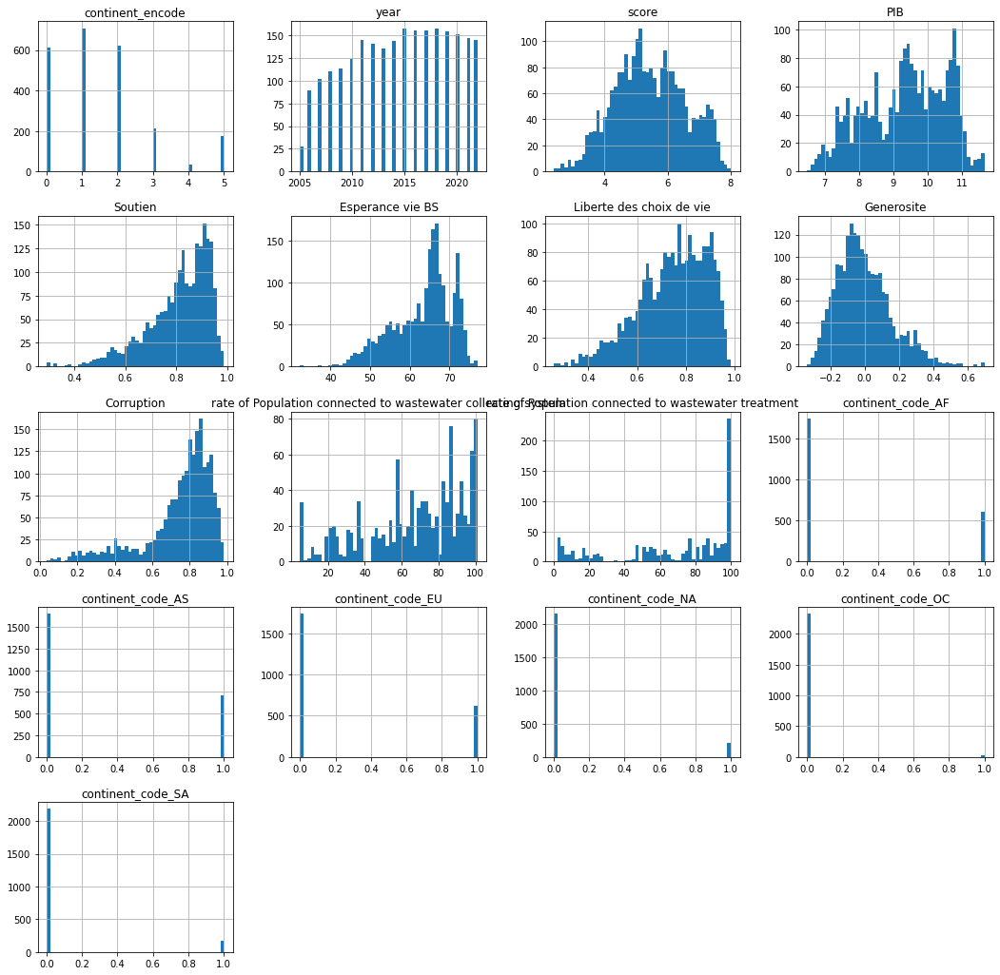

In [32]:
df_completed.hist(figsize=(18,18),bins=50)
figure.set_size_inches(18, 15, forward=True)
plt.show()

<div style="display: flex; background-color: indigo;" >

#### 3.1.3. Corrélations
</div>

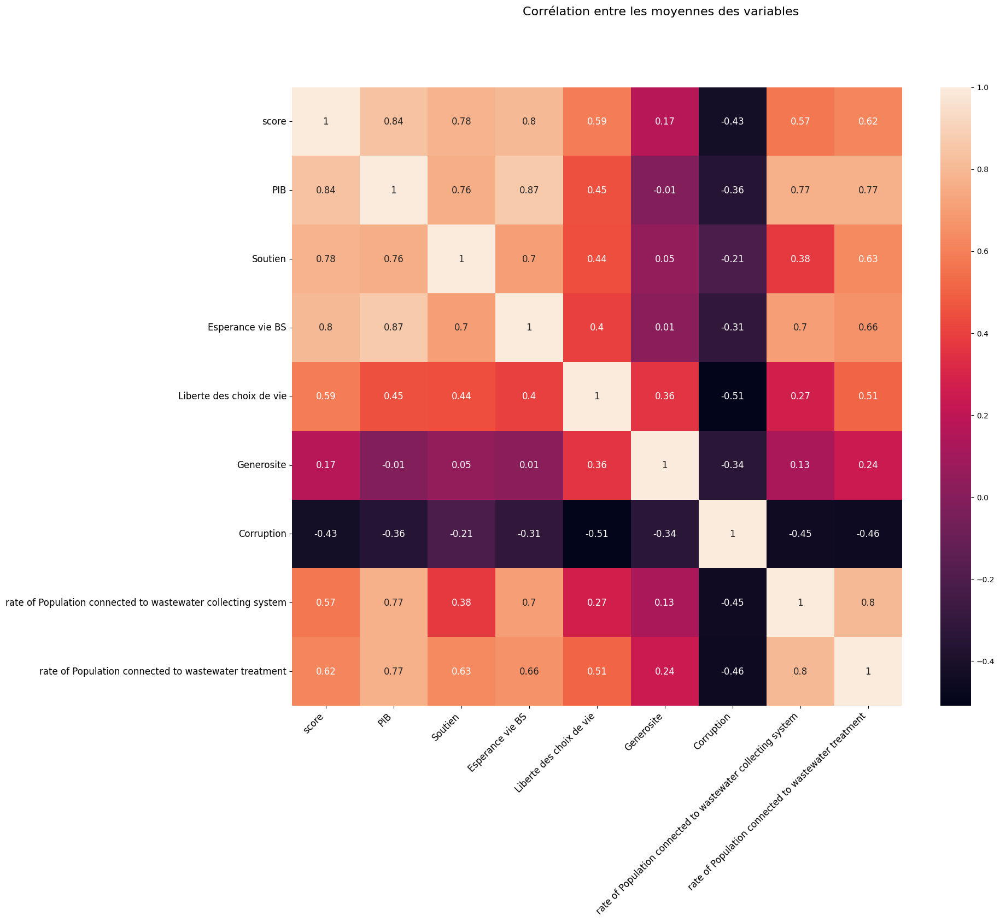

In [33]:
draw_correlation_graphe(df_mean, "Corrélation entre les moyennes des variables", verbose=verbose,fontsize=12)

On constate que les corrélations sont mieux marquées sur la df avec les moyennes des données.

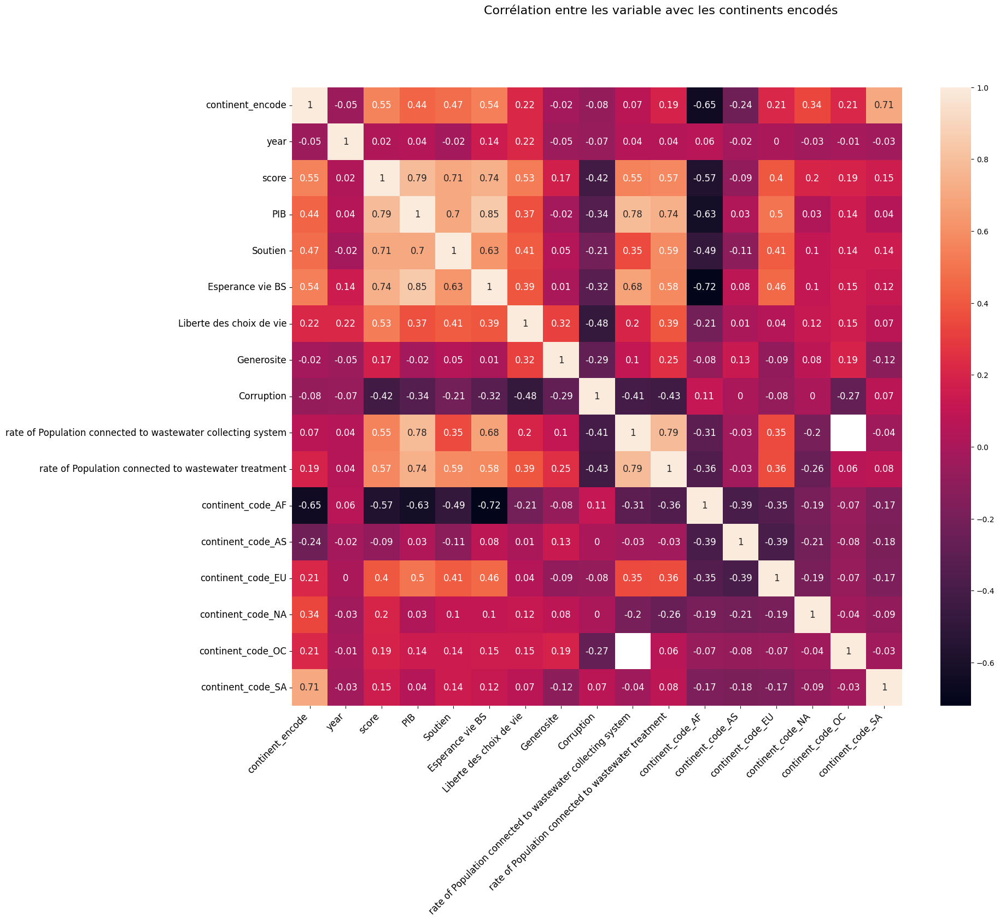

In [34]:
draw_correlation_graphe(df_completed, "Corrélation entre les variable avec les continents encodés", verbose=verbose,fontsize=12)

Fonctionnellement nous avons un préssentiment qu'il y a une corrélation entre les continents et le score.

Numériquement, l'encodage via LabelEncoder montre une corrélation, mais elle est faussée du fait qu'elle implique une comparaison possible entre les continents.

Afin d'éviter une comparaison numérique entre les pays, nous avons utilisé OneHotEncoder pour séparer les continents et éviter une comparaison, cependant ceci implique que les continents ne sont plus exclusif entre eux.

L'équivalent de la corrélation fonctionnelle est donc un mixte de ces 2 représentations, qui reste difficile à mettre en évidence.

<div style="display: flex; background-color: indigo;" >

#### 3.1.4. Paiplot de la DF
</div>

Cf. Annexe (pour éviter de le générer à chaque fois)

<div style="display: flex; background-color: Green; padding: 7px;" >

### 3.3. Focus sur le score
</div>

<div style="display: flex; background-color: indigo;" >

#### 3.3.1 Cartographie du score moyen des pays
</div>

In [35]:
fig = px.choropleth(df_mean, locations="alpha3",
                    color="score", # lifeExp is a column of gapminder
                    hover_name="country_official", # column to add to hover information
                    color_continuous_scale=[(0, "red"), (0.5, "yellow"), (1, "green")])
fig.update_layout(title=f"Scores moyen de {annee_min} à {annee_max}")
fig.update_layout(margin=dict(l=10, r=20, t=40, b=10))
fig.show()

> - On remarque le continent Américain (nord et sud), l'Europe et l'Australie sont les continents avec les meilleurs score.
> - Les continents Africain et Asiatique quant à eux sont très disparatres même s'ils tendent vers un score moyen voir bas.

<div style="display: flex; background-color: indigo;" >

#### 3.3.2 Evolution pour le top pays
</div>

In [36]:
score_only_by_country = df_completed[['country_official', 'continent_code', 'alpha3', 'year', 'score']].copy()

dic_year = {}

for y in range(annee_min, annee_max+1):
    score_only_by_country[y] = np.nan
    score_only_by_country.loc[score_only_by_country["year"]==y,y] = score_only_by_country["score"]
    dic_year[y] = ["sum"]
print(dic_year)

{2005: ['sum'], 2006: ['sum'], 2007: ['sum'], 2008: ['sum'], 2009: ['sum'], 2010: ['sum'], 2011: ['sum'], 2012: ['sum'], 2013: ['sum'], 2014: ['sum'], 2015: ['sum'], 2016: ['sum'], 2017: ['sum'], 2018: ['sum'], 2019: ['sum'], 2020: ['sum'], 2021: ['sum'], 2022: ['sum']}


In [37]:
# il faut fusionner les lignes par pays
score_only_by_country2 = score_only_by_country.groupby(by=['country_official', 'continent_code', 'alpha3']).agg(dic_year)
score_only_by_country2 = score_only_by_country2.droplevel(1, axis=1) 
print(score_only_by_country.shape)
print(score_only_by_country2.shape)
score_only_by_country2.head()

(2359, 23)
(164, 18)


,,,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
country_official,continent_code,alpha3,,,,,,,,,,,,,,,,,,
Arab Republic of Egypt,AF,EGY,5.168,0.000,5.541,4.632,5.066,4.669,4.174,4.204,3.559,4.885,4.763,4.557,3.929,4.005,4.328,4.151,4.283,4.288
Argentine Republic,SA,ARG,0.000,6.313,6.073,5.961,6.424,6.441,6.776,6.468,6.582,6.671,6.697,6.427,6.039,5.793,6.086,5.975,5.929,5.967
Australia,OC,AUS,7.341,0.000,7.285,7.254,0.000,7.450,7.406,7.196,7.364,7.289,7.309,7.250,7.257,7.177,7.234,7.223,7.183,7.162
Belize,NA,BLZ,0.000,0.000,6.451,0.000,0.000,0.000,0.000,0.000,0.000,5.956,0.000,5.956,5.956,5.956,0.000,0.000,0.000,0.000
Bolivarian Republic of Venezuela,SA,VEN,7.170,6.525,0.000,6.258,7.189,7.478,6.580,7.067,6.553,6.136,5.569,4.041,5.071,5.006,5.081,5.053,4.892,4.925


In [38]:
# Trie des pays sur la moyenne du score
score_only_by_country2 = score_only_by_country2.reset_index()
score_only_by_country2 = score_only_by_country2.set_index('country_official')
score_only_by_country2 = score_only_by_country2.reindex(index=df_mean['country_official'])
score_only_by_country2.head()

,continent_code,alpha3,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
country_official,,,,,,,,,,,,,,,,,,,,
Kingdom of Denmark,EU,DNK,8.019,0.000,7.834,7.971,7.683,7.771,7.788,7.520,7.589,7.508,7.514,7.558,7.594,7.649,7.693,7.646,7.620,7.636
Republic of Finland,EU,FIN,0.000,7.672,0.000,7.671,0.000,7.393,7.354,7.420,7.445,7.385,7.448,7.660,7.788,7.858,7.780,7.809,7.842,7.821
Swiss Confederation,EU,CHE,0.000,7.473,0.000,0.000,7.525,0.000,0.000,7.776,0.000,7.493,7.572,7.459,7.474,7.509,7.694,7.560,7.571,7.512
Kingdom of Norway,EU,NOR,0.000,7.416,0.000,7.632,0.000,0.000,0.000,7.678,0.000,7.444,7.603,7.596,7.579,7.444,7.442,7.488,7.392,7.365
Republic of Iceland,EU,ISL,0.000,0.000,0.000,6.888,0.000,0.000,0.000,7.591,7.501,0.000,7.498,7.510,7.476,7.495,7.533,7.504,7.554,7.557


In [39]:
n_top = 30
score_only_by_country_t = score_only_by_country2[range(annee_min, annee_max+1)].head(n_top).T
score_only_by_country_t.head()

country_official,Kingdom of Denmark,Republic of Finland,Swiss Confederation,Kingdom of Norway,Republic of Iceland,Kingdom of the Netherlands,Kingdom of Sweden,Canada,New Zealand,Australia,...,United Arab Emirates,United Mexican States,French Republic,Czech Republic,Republic of Panama,Federative Republic of Brazil,Kingdom of Saudi Arabia,Kingdom of Spain,Republic of Singapore,State of Qatar
2005,8.019,0.000,0.000,0.000,0.000,7.464,7.376,7.418,0.000,7.341,...,0.000,6.581,7.093,6.439,0.000,6.637,7.080,7.153,0.000,0.000
2006,0.000,7.672,7.473,7.416,0.000,0.000,0.000,0.000,7.305,0.000,...,6.734,0.000,6.583,0.000,6.128,0.000,0.000,0.000,6.463,0.000
2007,7.834,0.000,0.000,0.000,0.000,7.452,7.241,7.482,7.604,7.285,...,0.000,6.525,0.000,6.500,6.894,6.321,7.267,6.995,6.834,0.000
2008,7.971,7.671,0.000,7.632,6.888,7.631,7.516,7.486,7.381,7.254,...,0.000,6.829,7.008,0.000,6.931,6.691,6.811,7.294,6.642,0.000
2009,7.683,0.000,7.525,0.000,0.000,0.000,7.266,7.488,0.000,0.000,...,6.866,6.963,6.283,0.000,7.034,7.001,6.148,6.199,6.145,6.418


In [40]:
# on remplace les 0 par des nan pour éviter des chutes dans les courbes
score_only_by_country_t.replace(0, np.nan, inplace=True)

In [41]:
draw_top_score(score_only_by_country_t=score_only_by_country_t, n_top = 25, verbose=verbose)

Le top 30 représente encore trop de données, donc diminution au top 10.

In [42]:
draw_top_score(score_only_by_country_t=score_only_by_country_t, n_top = 10, verbose=verbose)

Les données sont encore peut lisible, même avec seulement le top 10.

<div style="display: flex; background-color: indigo;" >

#### 3.3.2 Comparaison des évolutions des scores pour les pays du top
</div>

In [43]:
draw_top_by_country_score(score_only_by_country_t=score_only_by_country_t, n_top = 5, verbose=verbose)

<div style="display: flex; background-color: indigo;" >

#### 3.3.3 Comparaison de l'évolution des données pour les pays du top
</div>

In [44]:
n_top = 5
countries_names = list(df_mean[country_official_col_name].values)[0:n_top]

for country_name in countries_names:
    _, _, _ = draw_country_data_evolution(df_completed, country_name)


C:\Program Files\Python39\lib\site-packages\sklearn\utils\extmath.py:985: RuntimeWarning:

invalid value encountered in true_divide

C:\Program Files\Python39\lib\site-packages\sklearn\utils\extmath.py:990: RuntimeWarning:

invalid value encountered in true_divide

C:\Program Files\Python39\lib\site-packages\sklearn\utils\extmath.py:1020: RuntimeWarning:

invalid value encountered in true_divide



<div style="display: flex; background-color: indigo;" >

#### 3.3.4 Evolution pour la France
</div>

In [45]:
fig = px.line(score_only_by_country_t[country_official_France], markers=True, title=f"Evolution des scores pour {country_official_France}.")
fig.update_layout(
    xaxis_title="Années",
    yaxis_title="Score",
    legend_title="Nom officiel des pays",
)
fig.update_layout(margin=dict(l=10, r=20, t=40, b=10))
fig.update_xaxes(dtick=1)
fig.show()

In [46]:
_, _, _ = draw_country_data_evolution(df_completed, country_official_France)

<div style="display: flex; background-color: indigo;" >

#### 3.3.3 Evolution par continent
</div>

In [47]:
dic_year_mean = {}
for k in dic_year.keys():
    dic_year_mean[k] = ['mean']
print(dic_year_mean)

{2005: ['mean'], 2006: ['mean'], 2007: ['mean'], 2008: ['mean'], 2009: ['mean'], 2010: ['mean'], 2011: ['mean'], 2012: ['mean'], 2013: ['mean'], 2014: ['mean'], 2015: ['mean'], 2016: ['mean'], 2017: ['mean'], 2018: ['mean'], 2019: ['mean'], 2020: ['mean'], 2021: ['mean'], 2022: ['mean']}


In [48]:
# il faut fusionner les lignes par continent
score_only_by_continent = score_only_by_country.groupby(by=['continent_code']).agg(dic_year_mean)
score_only_by_continent = score_only_by_continent.droplevel(1, axis=1) 
print(score_only_by_continent.shape)
score_only_by_continent.head()

(6, 18)


,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
continent_code,,,,,,,,,,,,,,,,,,
AF,5.168000,4.074182,4.435857,4.296296,4.421240,4.335615,4.485769,4.413412,4.088323,4.184632,4.340370,4.197636,4.377089,4.477326,4.441422,4.433818,4.539675,4.527625
AS,5.804857,5.183828,5.240600,5.104833,5.313487,5.356275,5.358886,5.187512,5.232667,5.339214,5.279891,5.290533,5.264311,5.246304,5.334067,5.302372,5.335814,5.334548
EU,6.650000,6.028375,5.761857,6.561391,5.839033,5.935029,5.938946,6.089325,6.003763,6.052462,6.101575,6.173425,6.267575,6.385625,6.423375,6.361775,6.421313,6.469450
NA,6.999500,5.679250,6.276818,6.074167,6.636700,6.299273,6.068769,6.081727,6.201538,6.098462,5.979538,6.036571,6.231214,6.122214,6.187000,6.184000,6.123000,6.288818
OC,7.341000,7.305000,7.444500,7.317500,NaN,7.337000,7.298500,7.223000,7.322000,7.297500,7.363500,7.238000,7.292000,7.273500,7.219500,7.261500,7.230000,7.181000


In [49]:
score_only_by_continent_t = score_only_by_continent[range(annee_min, annee_max+1)].T
# on remplace les 0 par des nan pour éviter des chutes dans les courbes
score_only_by_continent_t.replace(0, np.nan, inplace=True)
score_only_by_continent_t.head()

continent_code,AF,AS,EU,NA,OC,SA
2005,5.168000,5.804857,6.650000,6.999500,7.3410,6.903500
2006,4.074182,5.183828,6.028375,5.679250,7.3050,5.627889
2007,4.435857,5.240600,5.761857,6.276818,7.4445,5.702700
2008,4.296296,5.104833,6.561391,6.074167,7.3175,5.782500
2009,4.421240,5.313487,5.839033,6.636700,NaN,6.287900


In [50]:
fig = px.line(score_only_by_continent_t, markers=True, title=f"Evolution des scores par continent.")
fig.update_layout(
    xaxis_title="Années",
    yaxis_title="Score",
    legend_title="Code continent",
)
fig.update_layout(margin=dict(l=10, r=20, t=40, b=10))
fig.update_xaxes(dtick=1)
fig.show()

<div style="display: flex; background-color: Blue; padding: 15px;" >

## 4.Visualisation des clusters via réduction des données
</div>

<div style="display: flex; background-color: Green; padding: 7px;" >

### 4.1. Traitement des NaN
</div>

In [51]:
numeric_columns_name = get_numeric_columns_names(df_completed)
print(numeric_columns_name)

['continent_encode', 'year', 'score', 'PIB', 'Soutien', 'Esperance vie BS', 'Liberte des choix de vie', 'Generosite', 'Corruption', 'rate of Population connected to wastewater collecting system', 'rate of Population connected to wastewater treatment', 'continent_code_AF', 'continent_code_AS', 'continent_code_EU', 'continent_code_NA', 'continent_code_OC', 'continent_code_SA']


In [52]:
# On supprime les NaN dans la DF globale pour pouvoir faire le lien ensuite avec les données traitées.

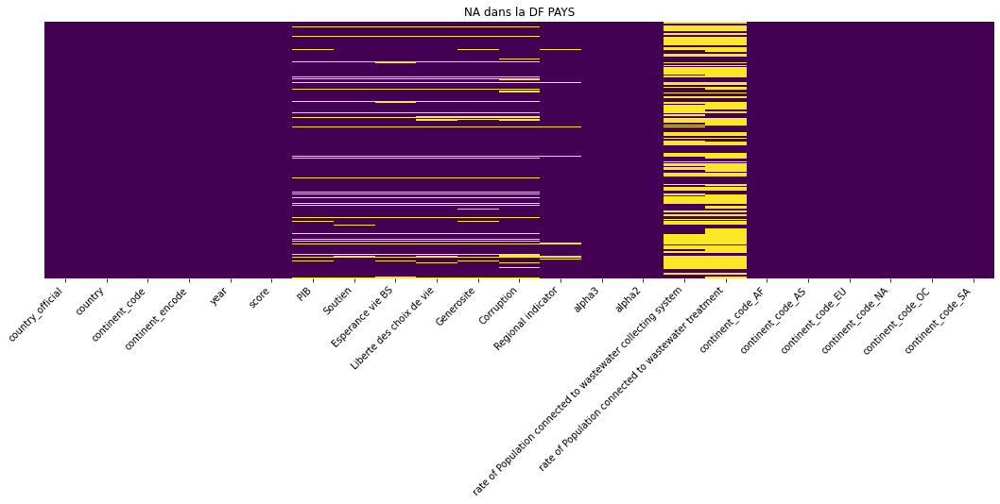

In [53]:
figure, ax = color_graph_background(1,1)
sns.heatmap(df_completed.isnull(), yticklabels=False,cbar=False, cmap='viridis')
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.title("NA dans la DF PAYS")
figure.set_size_inches(18, 5, forward=True)
plt.show()

Beaucoup de données seraient supprimées si l'on se contente de supprimer toutes les lignes avec des NaN.

Je choisi donc de supprimer les 2 colonnes qui ont le plus de NaN pour limiter la perte de données, ce qui nous fait perdre 460 lignes au lieu de 1658.

(1899, 21) (before: (2359, 23) )


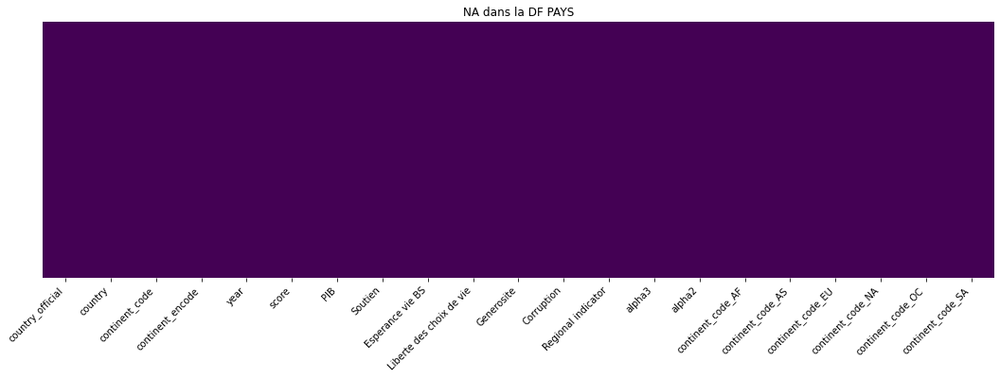

In [54]:
df_complete_no_nan = df_completed.copy()

# on supprime les 2 colonnes qui ont le plus de NAN, et ce afin de limiter la perte de lignes 
df_complete_no_nan = df_complete_no_nan.drop(['rate of Population connected to wastewater collecting system', 'rate of Population connected to wastewater treatment'], axis=1)

# reduire et centrer les donnees, pour ça il faut supprimer les NA
df_complete_no_nan = df_complete_no_nan.dropna()
print(df_complete_no_nan.shape, "(before:",df_completed.shape,")")

figure, ax = color_graph_background(1,1)
sns.heatmap(df_complete_no_nan.isnull(), yticklabels=False,cbar=False, cmap='viridis')
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.title("NA dans la DF PAYS")
figure.set_size_inches(18, 5, forward=True)
plt.show()

In [55]:
numeric_columns_name = get_numeric_columns_names(df_complete_no_nan)
print(numeric_columns_name)

['continent_encode', 'year', 'score', 'PIB', 'Soutien', 'Esperance vie BS', 'Liberte des choix de vie', 'Generosite', 'Corruption', 'continent_code_AF', 'continent_code_AS', 'continent_code_EU', 'continent_code_NA', 'continent_code_OC', 'continent_code_SA']


In [56]:
df_numeric_no_nan = df_complete_no_nan[numeric_columns_name].copy()
print(df_numeric_no_nan.shape, "(before:",df_complete_no_nan.shape,")")
print("{:_} NAN".format(df_numeric_no_nan.isna().sum().sum()))

(1899, 15) (before: (1899, 21) )
0 NAN


<div style="display: flex; background-color: Green; padding: 7px;" >

### 4.2. Création de X
</div>

In [57]:
# selection des colonnes à prendre en compte dans l'ACP
X = df_numeric_no_nan.copy()

# il faut supprimer le score de la liste des données
y = X[['score']]
X = X.drop(['score','year'], axis=1)

<div style="display: flex; background-color: Green; padding: 7px;" >

### 4.3. Standardisation des données
</div>

In [58]:
X_scale = StandardScaler().fit_transform(X)
X_scale = pd.DataFrame(data=X_scale, columns=X.columns)
X_scale.head()

,continent_encode,PIB,Soutien,Esperance vie BS,Liberte des choix de vie,Generosite,Corruption,continent_code_AF,continent_code_AS,continent_code_EU,continent_code_NA,continent_code_OC,continent_code_SA
0,-1.114817,-0.086614,-0.538458,-0.452452,-0.958369,-0.596677,0.273018,1.674996,-0.589716,-0.633621,-0.326563,-0.124531,-0.297073
1,-1.114817,-0.060115,-0.332686,-0.444546,-1.852025,-0.448100,0.409113,1.674996,-0.589716,-0.633621,-0.326563,-0.124531,-0.297073
2,-1.114817,-0.063534,-0.464380,-0.423463,-1.108503,-0.912402,0.588758,1.674996,-0.589716,-0.633621,-0.326563,-0.124531,-0.297073
3,-1.114817,-0.063534,-0.596074,-0.402380,-2.095100,-0.831923,0.703077,1.674996,-0.589716,-0.633621,-0.326563,-0.124531,-0.297073
4,-1.114817,-0.064389,-1.106390,-0.381297,-1.937816,-0.850495,0.882722,1.674996,-0.589716,-0.633621,-0.326563,-0.124531,-0.297073


<div style="display: flex; background-color: Green; padding: 7px;" >

### 4.4. Réduction
</div>

In [59]:
from sklearn import decomposition

In [60]:
n_components=3

In [149]:
def get_pca_x_reduce(X_scale, df, clusters=None,n_components=2, verbose=0):
    # calculer les composantes principales
    pca = decomposition.PCA(n_components=n_components)
    X_reduced = pca.fit_transform(X_scale)

    X_reduceddf = pd.DataFrame(X_reduced, index=X_scale.index, columns=["F"+str(i+1) for i in range(n_components)])
    if verbose:
       print(f"{df.shape} df")
       print(f"{X_scale.shape} X_scale")
       print(f"{X_reduceddf.shape} X_reduced")
   
    n_df = pd.concat([df,X_reduceddf], axis=1)
       
    if verbose:
       print(f"{n_df.shape} n_df")
    if clusters is not None:
       n_df["cluster"] = clusters
    return pca, X_reduceddf, n_df

In [146]:
df_complete_no_nan = df_complete_no_nan.reset_index()
df_complete_no_nan = df_complete_no_nan.drop(["index"], axis=1)
df_complete_no_nan

,country_official,country,continent_code,continent_encode,year,score,PIB,Soutien,Esperance vie BS,Liberte des choix de vie,...,Corruption,Regional indicator,alpha3,alpha2,continent_code_AF,continent_code_AS,continent_code_EU,continent_code_NA,continent_code_OC,continent_code_SA
0,Arab Republic of Egypt,Egypt,AF,0,2009,5.066,9.213,0.744,59.940,0.611,...,0.801,Middle East and North Africa,EGY,EG,1.0,0.0,0.0,0.0,0.0,0.0
1,Arab Republic of Egypt,Egypt,AF,0,2010,4.669,9.244,0.769,60.000,0.486,...,0.826,Middle East and North Africa,EGY,EG,1.0,0.0,0.0,0.0,0.0,0.0
2,Arab Republic of Egypt,Egypt,AF,0,2011,4.174,9.240,0.753,60.160,0.590,...,0.859,Middle East and North Africa,EGY,EG,1.0,0.0,0.0,0.0,0.0,0.0
3,Arab Republic of Egypt,Egypt,AF,0,2012,4.204,9.240,0.737,60.320,0.452,...,0.880,Middle East and North Africa,EGY,EG,1.0,0.0,0.0,0.0,0.0,0.0
4,Arab Republic of Egypt,Egypt,AF,0,2013,3.559,9.239,0.675,60.480,0.474,...,0.913,Middle East and North Africa,EGY,EG,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1894,the State of Palestine,Palestinian Territories,AS,1,2008,4.386,8.276,0.666,62.015,0.358,...,0.753,Middle East and North Africa,PSE,PS,0.0,1.0,0.0,0.0,0.0,0.0
1895,the State of Palestine,Palestinian Territories,AS,1,2009,4.470,8.329,0.738,62.132,0.468,...,0.797,Middle East and North Africa,PSE,PS,0.0,1.0,0.0,0.0,0.0,0.0
1896,the State of Palestine,Palestinian Territories,AS,1,2010,4.703,8.383,0.822,62.250,0.504,...,0.752,Middle East and North Africa,PSE,PS,0.0,1.0,0.0,0.0,0.0,0.0
1897,the State of Palestine,Palestinian Territories,AS,1,2020,4.553,8.389,0.825,62.250,0.646,...,0.824,Middle East and North Africa,PSE,PS,0.0,1.0,0.0,0.0,0.0,0.0


In [150]:
verbose = 1
pca, x_projeected, pca_df_temp = get_pca_x_reduce(X_scale=X_scale, df=df_complete_no_nan[['country_official', 'country', 'continent_code', 'continent_encode', 'year', 'score']], n_components=3, verbose=verbose)
pca_df_temp

(1899, 6) df
(1899, 13) X_scale
(1899, 3) X_reduced
(1899, 9) n_df


,country_official,country,continent_code,continent_encode,year,score,F1,F2,F3
0,Arab Republic of Egypt,Egypt,AF,0,2009,5.066,2.010912,-0.277728,-0.551565
1,Arab Republic of Egypt,Egypt,AF,0,2010,4.669,2.158600,-0.585903,-0.726732
2,Arab Republic of Egypt,Egypt,AF,0,2011,4.174,2.072125,-0.627167,-0.688836
3,Arab Republic of Egypt,Egypt,AF,0,2012,4.204,2.377716,-0.986142,-0.866766
4,Arab Republic of Egypt,Egypt,AF,0,2013,3.559,2.564318,-1.009315,-0.813047
...,...,...,...,...,...,...,...,...,...
1894,the State of Palestine,Palestinian Territories,AS,1,2008,4.386,1.840302,-0.450749,-0.515154
1895,the State of Palestine,Palestinian Territories,AS,1,2009,4.470,1.440925,-0.333281,-0.451490
1896,the State of Palestine,Palestinian Territories,AS,1,2010,4.703,1.041697,-0.242419,-0.497949
1897,the State of Palestine,Palestinian Territories,AS,1,2020,4.553,0.867629,-0.193081,-0.385978


In [63]:
pca_df_final = pd.concat([df_complete_no_nan[['country_official', 'country', 'continent_code', 'continent_encode',
       'year', 'score']],pca_df_temp], axis=1)
pca_df_final.head()

,country_official,country,continent_code,continent_encode,year,score,F1,F2,F3
3,Arab Republic of Egypt,Egypt,AF,0.0,2009.0,5.066,2.377716,-0.986142,-0.866766
4,Arab Republic of Egypt,Egypt,AF,0.0,2010.0,4.669,2.564318,-1.009315,-0.813047
5,Arab Republic of Egypt,Egypt,AF,0.0,2011.0,4.174,2.366557,-0.294080,-0.557881
6,Arab Republic of Egypt,Egypt,AF,0.0,2012.0,4.204,1.772511,0.165310,-0.444621
7,Arab Republic of Egypt,Egypt,AF,0.0,2013.0,3.559,1.658455,-0.335615,-0.626530


In [64]:
total_var =round(pca.explained_variance_ratio_.sum() * 100,2)
total_var

58.74

In [65]:
px.scatter_3d(pca_df_final, x="F1", y="F2", z="F3", color='continent_encode', title=f"PCA {total_var} % de la variance")

In [66]:
px.scatter_3d(pca_df_final, x="F1", y="F2", z="F3", color='score', title=f"PCA {total_var} % de la variance")

<div style="display: flex; background-color: Blue; padding: 15px;" >

## 5.Clustering
</div>

In [67]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [68]:
random_state=42

<div style="display: flex; background-color: Green; padding: 7px;" >

### 4.1. Déterminer le nombre de clusters pertinent
</div>

In [69]:
nb_clusters = range(1, 10)

<div style="display: flex; background-color: indigo;" >

#### 4.1.1. Méthode Elbow
</div>

In [70]:
from scipy.spatial.distance import cdist

In [71]:
def get_elbow_data(X, nb_clusters):
    distortions = []
    inertias = []
    for k in nb_clusters:
        kmeanModel = KMeans(n_clusters=k).fit(X)
            
        distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_,
                                            'euclidean'), axis=1)) / X.shape[0])
        inertias.append(kmeanModel.inertia_)
    return distortions, inertias

In [72]:
distortions, inertias = get_elbow_data(X, nb_clusters)

In [73]:
sub_plot_title = ["Distortion", "Inertie"]
fig = make_subplots(rows=1, cols=2, subplot_titles=tuple(sub_plot_title))
fig.update_annotations(font_size=12)

sub_fig = go.Scatter(x=np.array(nb_clusters), y=np.array(distortions), name='Distortion' , showlegend=False)
fig.add_trace(sub_fig, row=1, col=1)

sub_fig = go.Scatter(x=np.array(nb_clusters), y=np.array(inertias), name='Inertie' ,showlegend=False)
fig.add_trace(sub_fig, row=1, col=2)

fig.update_layout(
    xaxis_title="Nb clusters",
)

fig.update_layout(height=500, width=1000, title_text=f"Méthode Elbow")
fig.update_xaxes(dtick=1)
fig.show()

- Sur la courbe de distortion, le nombre de clusters approprié est 3 ou 4. 
- Sur la courbe d'inertie, 3 semble plus approprié.

In [74]:
from kneed import KneeLocator

In [76]:
kl = KneeLocator(
    nb_clusters, inertias, curve="convex", direction="decreasing"
)
kl.elbow

3

Le module KneeLocator confirme le nombre de clusters optimal à 3 pour la méthode Elbow.

Il est possible de confirmer ce nombre avec une autre méthode, par exemple la méthode Silhouette.

<div style="display: flex; background-color: indigo;" >

#### 4.1.2. Méthode Silhouette
</div>

Afin de comparer le même interval qu'avec la méthode Elbow, nous avons choisi d'aller jusqu'à 10 également, mais la méthode Elbow, nous avais permis de constater qu'il n'y avait pas d'intérêt au-delà de 6, nous aurions donc pu fixer la limite de l'intervalle à 6.


In [177]:
# on commence le nombre de cluster à 2
nb_clusters = range(2, 10)

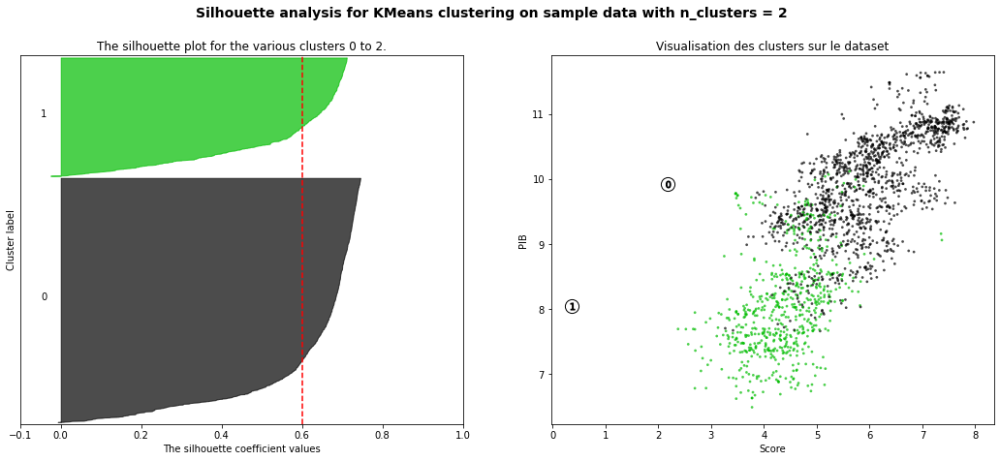

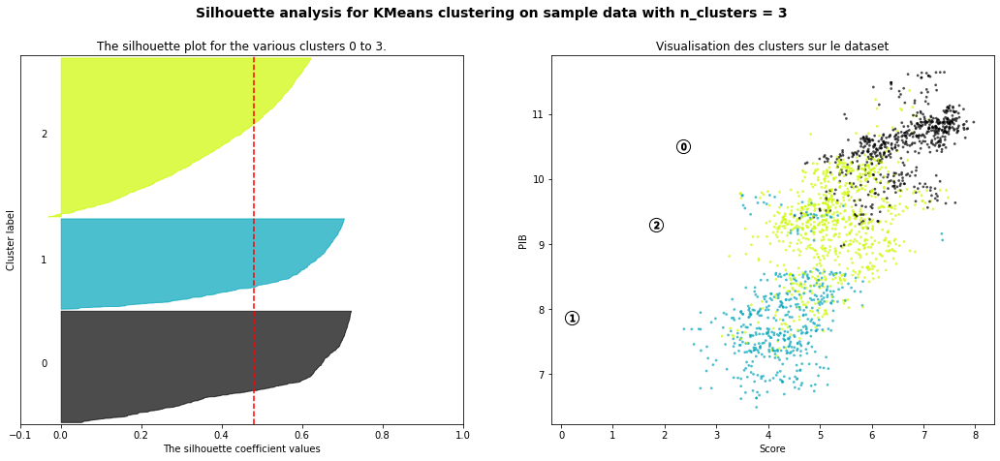

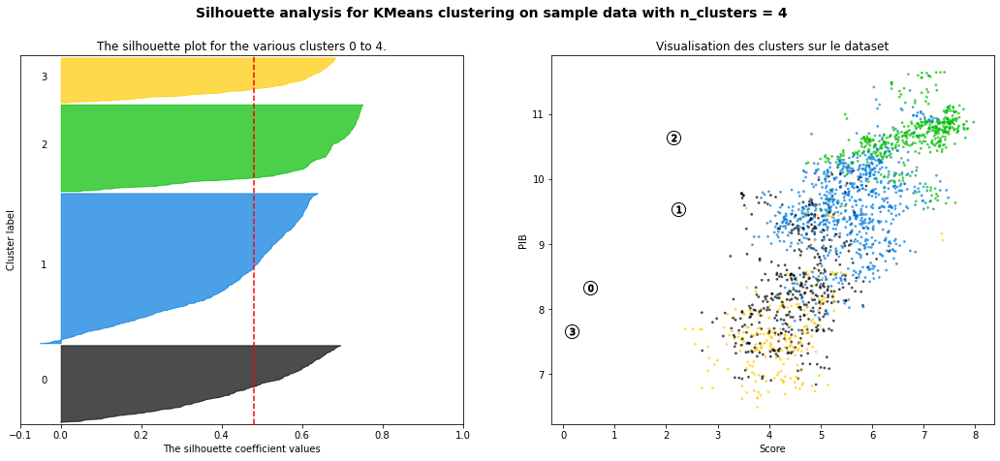

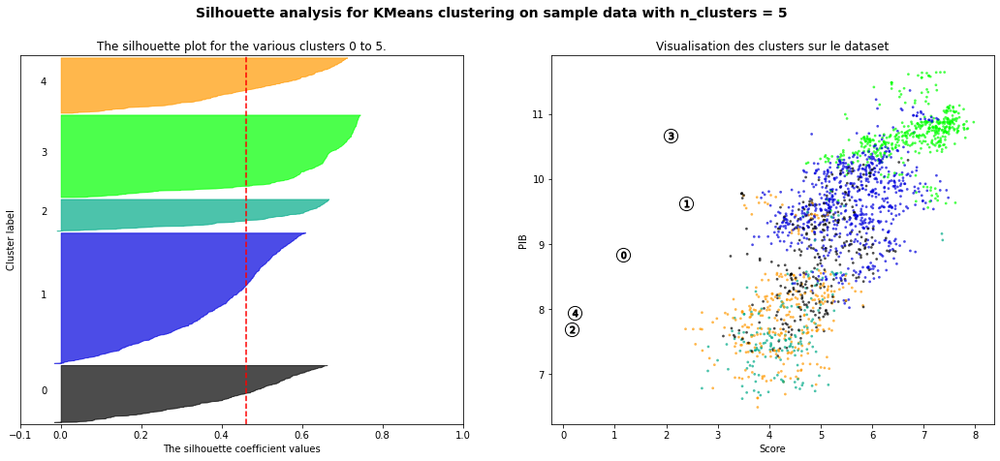

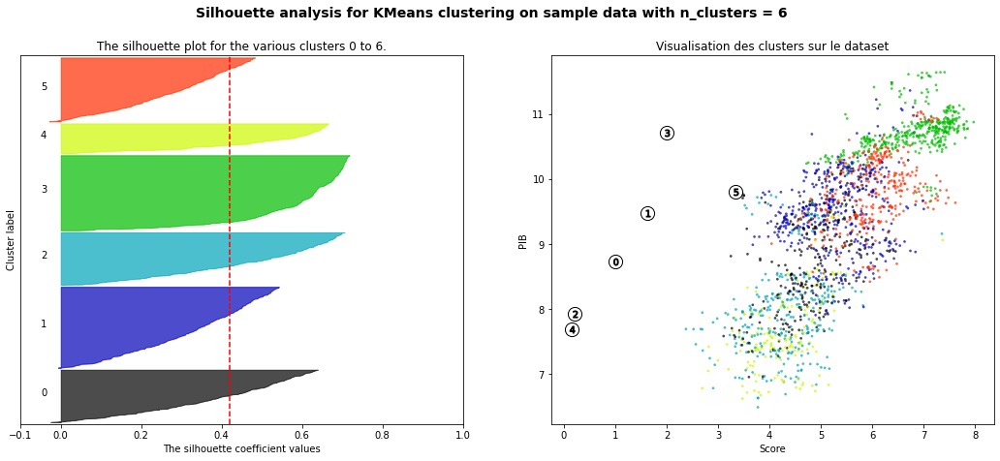

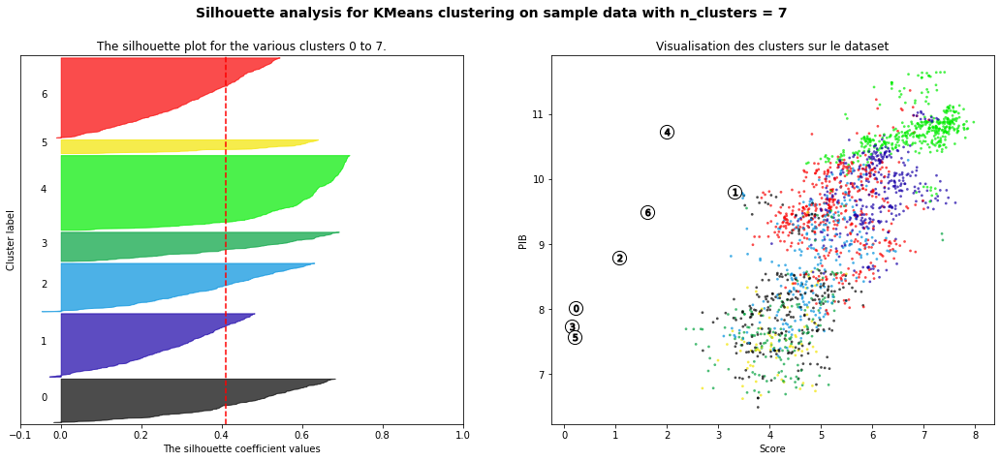

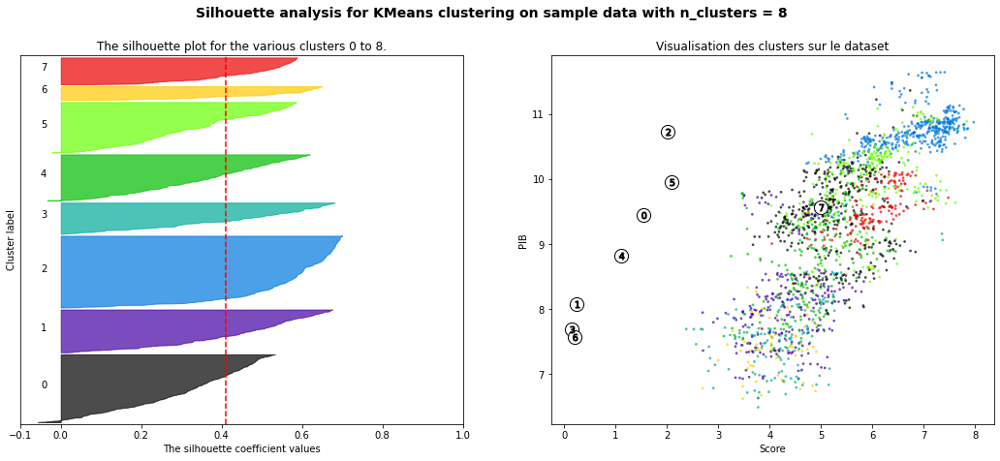

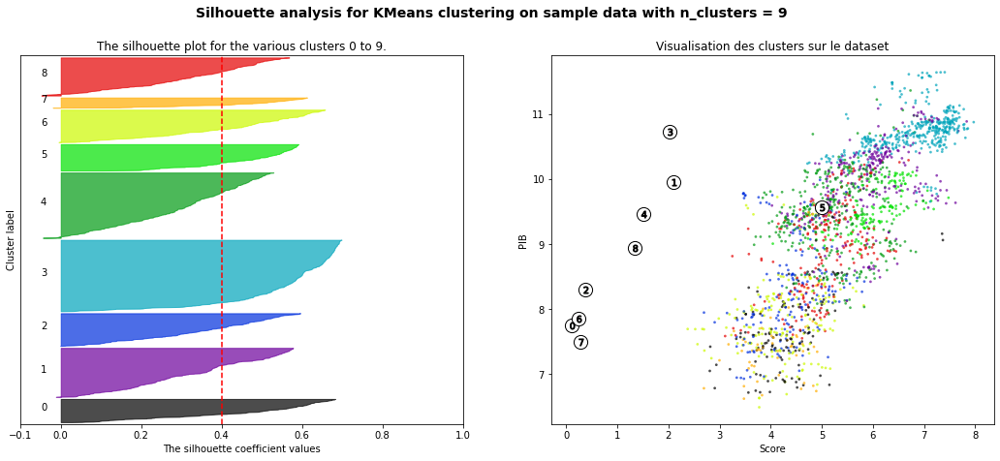

In [178]:
silhouette_n_clusters = draw_silhouette_curve(df_complete_no_nan, X, nb_clusters,x_col = (5, "Score"), y_col=(6, "PIB"), random_state=random_state, verbose=verbose)

- 2 clusters : les clusters sont déséquilibrés
- 3 et 4 clusters : on retrouve le même choix possible qu'avec la méthode Elbow, les épaisseurs sont similaires et les clusters semblent identifiables sur le scatter
- 5 et plus : il y a trop de disparités / déséquilibre entre les clusters et certains sont en dessous de la moyenne

En résumé, la méthode silhouette confirme les résultats de la méthode Elbow.

Avec la courbe finale, on peut voir que la pente de la courbe diminue à partir de 3 clusters, ce qui confirme donc le choix de 3 clusters (par rapport à 4).

<div style="display: flex; background-color: indigo;" >

#### 4.1.3. Méthode avancée : DBSCAN
</div>

<div style="display: flex; background-color: deeppink;" >

##### Comparaison entre DBSCAN et Kmean
</div>

In [94]:
# on commence le nombre de cluster à 2
nb_clusters = range(2, 10)
nb_clusters

range(2, 10)

ERROR : 2 clusters : dbscan_silhouette = Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)


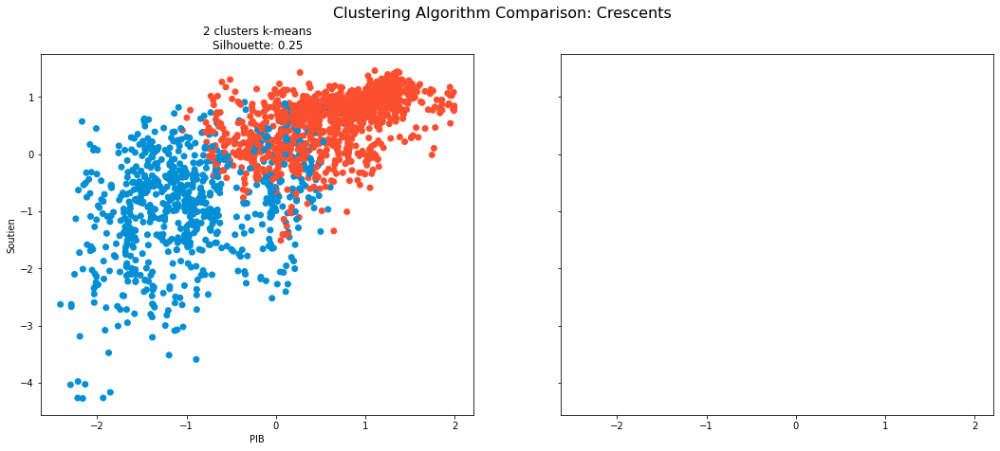

3 clusters : kmeans_silhouette = 0.28 <> dbscan_silhouette = -0.5


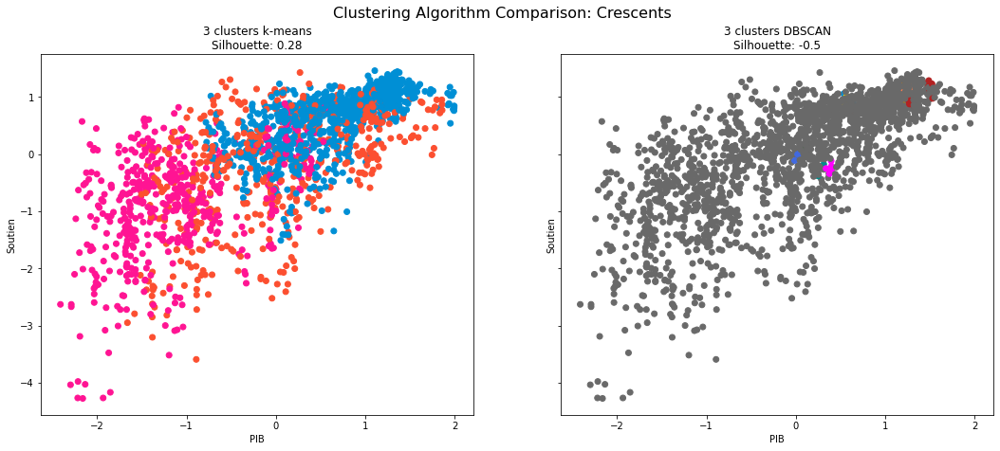

4 clusters : kmeans_silhouette = 0.35 <> dbscan_silhouette = -0.39


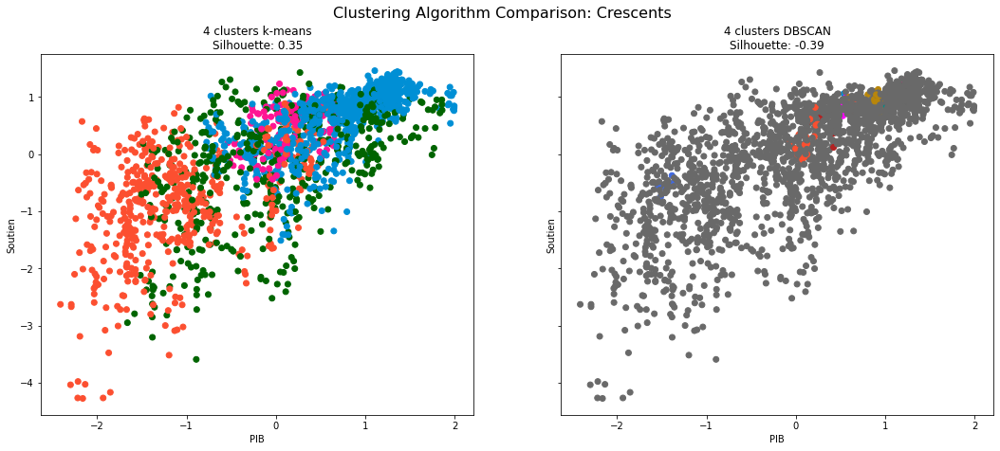

5 clusters : kmeans_silhouette = 0.41 <> dbscan_silhouette = -0.2


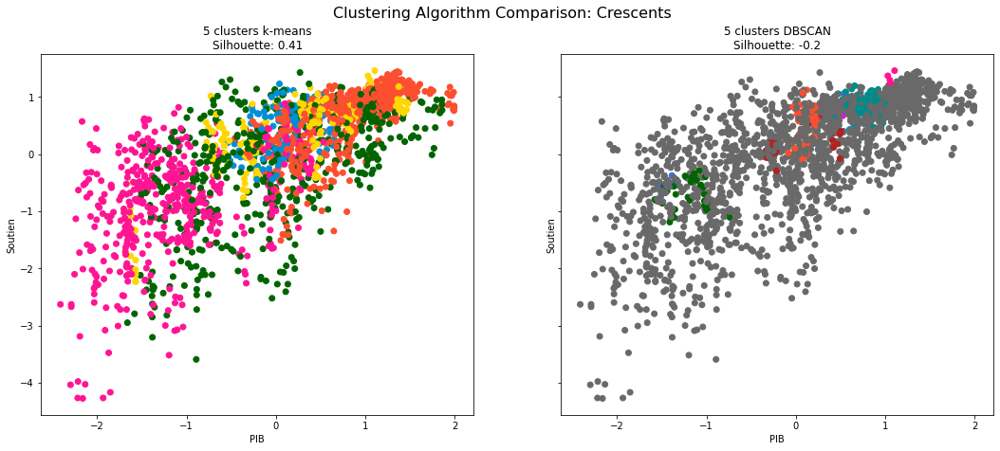

6 clusters : kmeans_silhouette = 0.45 <> dbscan_silhouette = -0.11


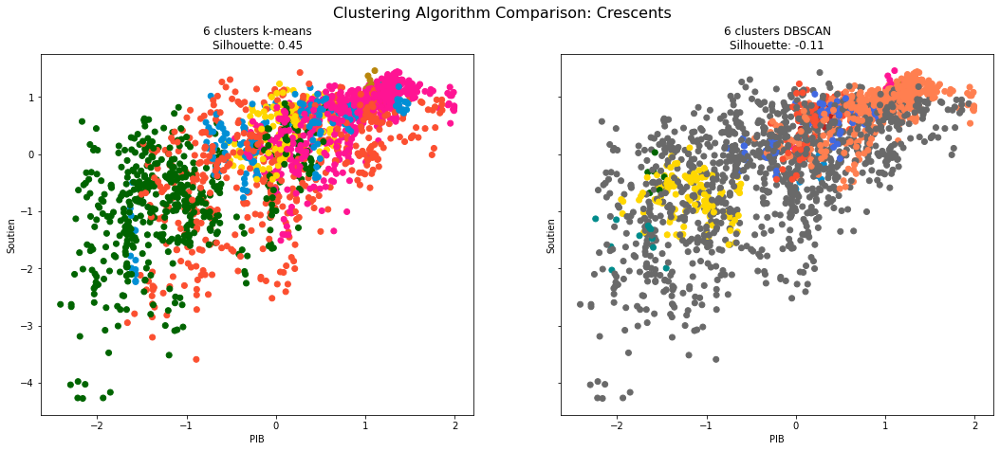

7 clusters : kmeans_silhouette = 0.46 <> dbscan_silhouette = 0.01


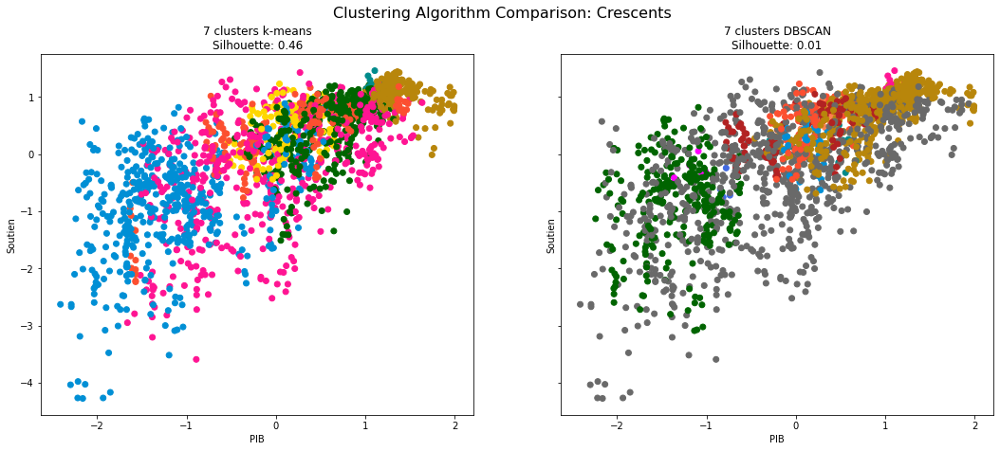

8 clusters : kmeans_silhouette = 0.43 <> dbscan_silhouette = 0.08


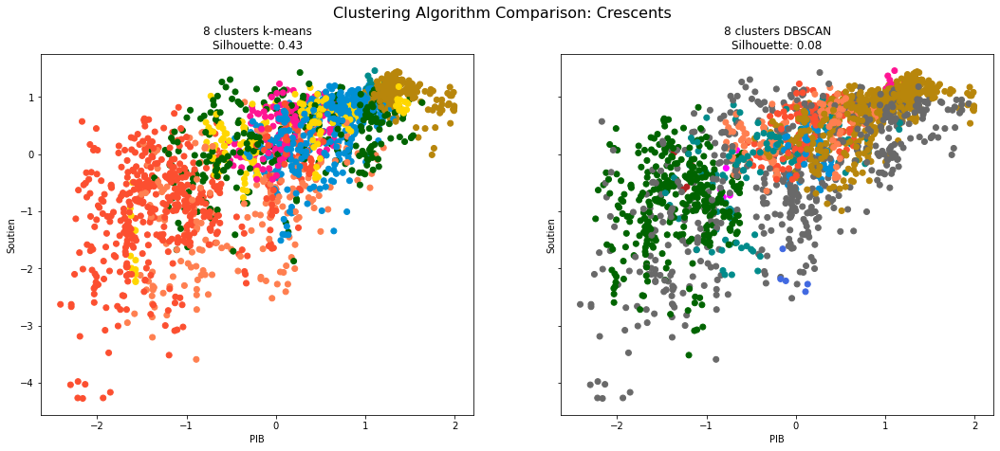

9 clusters : kmeans_silhouette = 0.43 <> dbscan_silhouette = 0.19


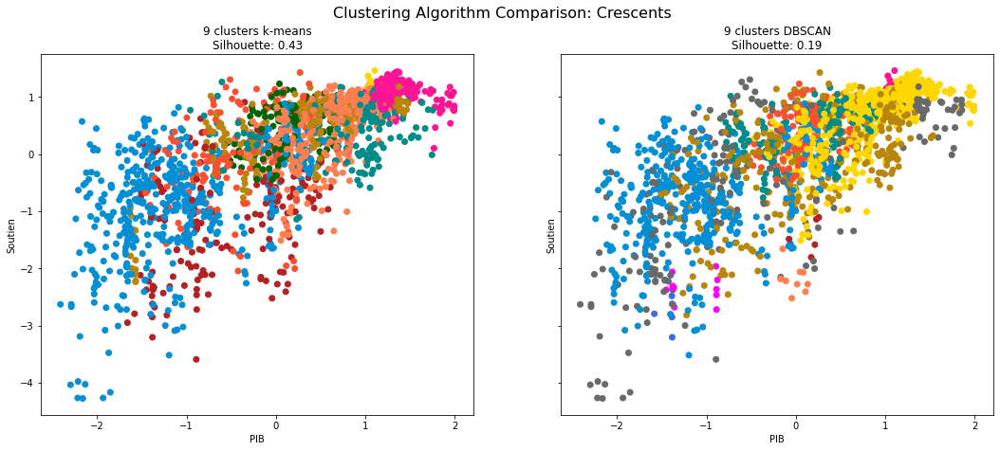

In [99]:
draw_kmeans_and_DBSCAN_comparison(X_scale, nb_clusters, features_column_name=["PIB", "Soutien"], verbose=verbose)

ERROR : 2 clusters : dbscan_silhouette = Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)


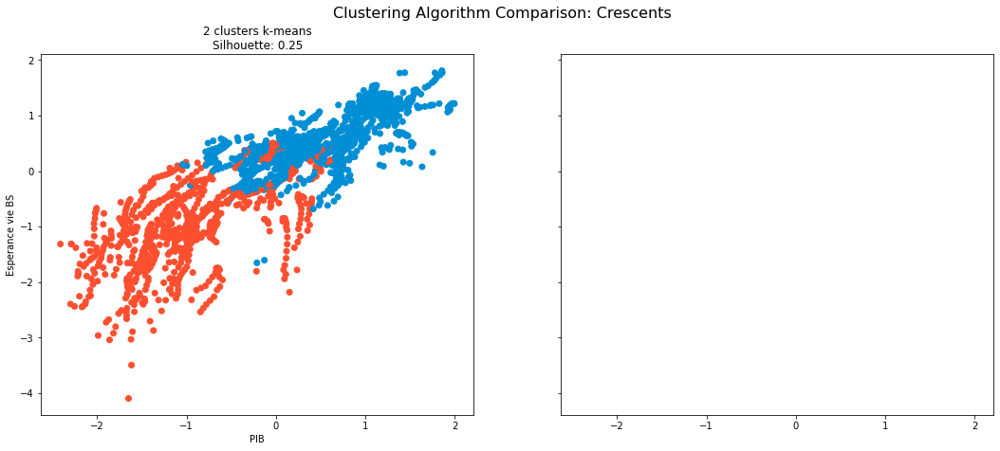

3 clusters : kmeans_silhouette = 0.28 <> dbscan_silhouette = -0.5


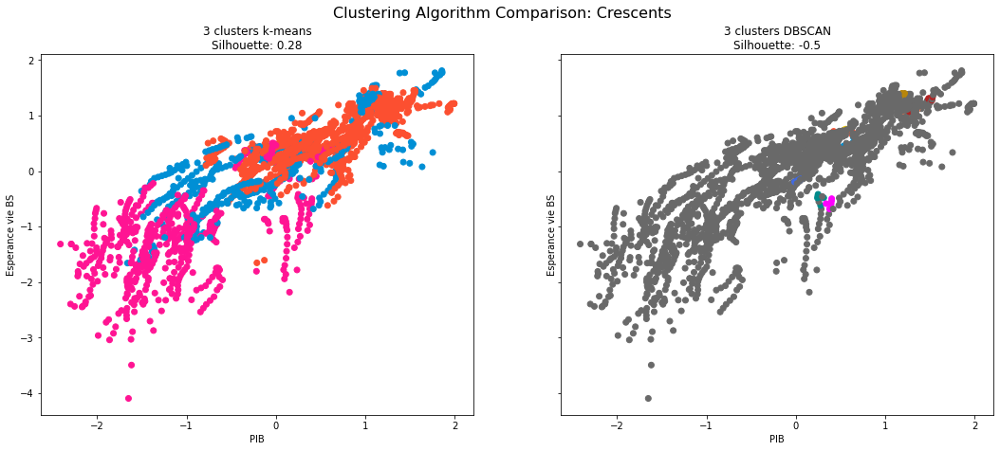

4 clusters : kmeans_silhouette = 0.35 <> dbscan_silhouette = -0.39


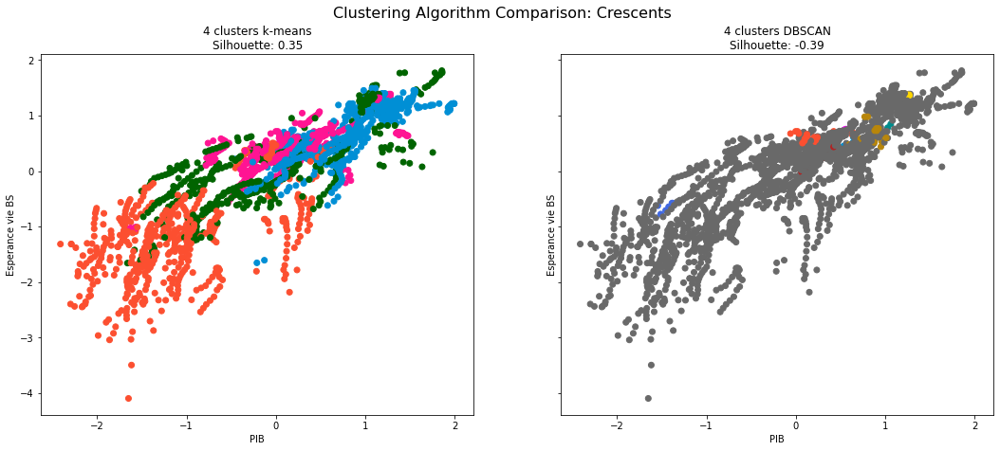

5 clusters : kmeans_silhouette = 0.42 <> dbscan_silhouette = -0.2


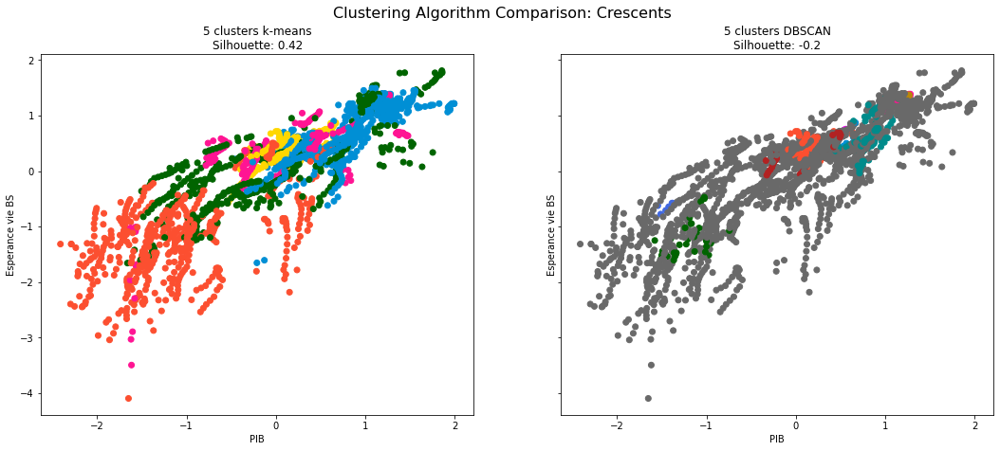

6 clusters : kmeans_silhouette = 0.45 <> dbscan_silhouette = -0.11


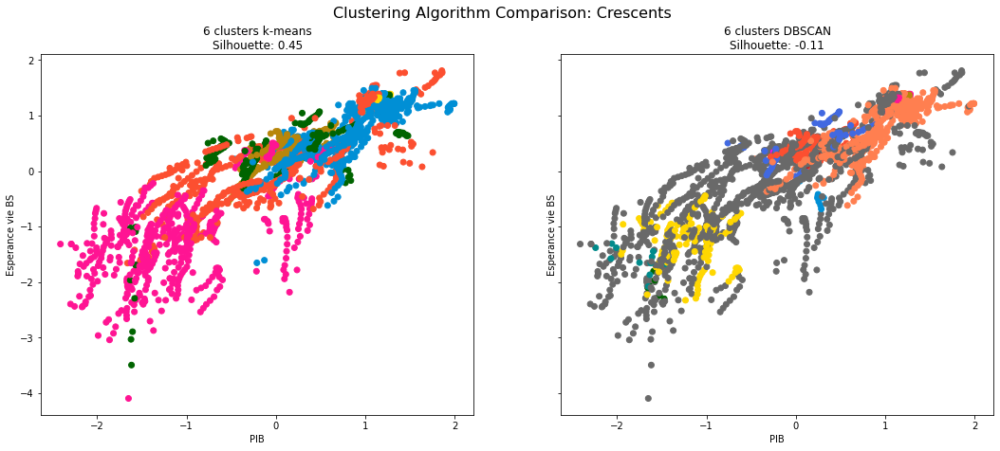

7 clusters : kmeans_silhouette = 0.46 <> dbscan_silhouette = 0.01


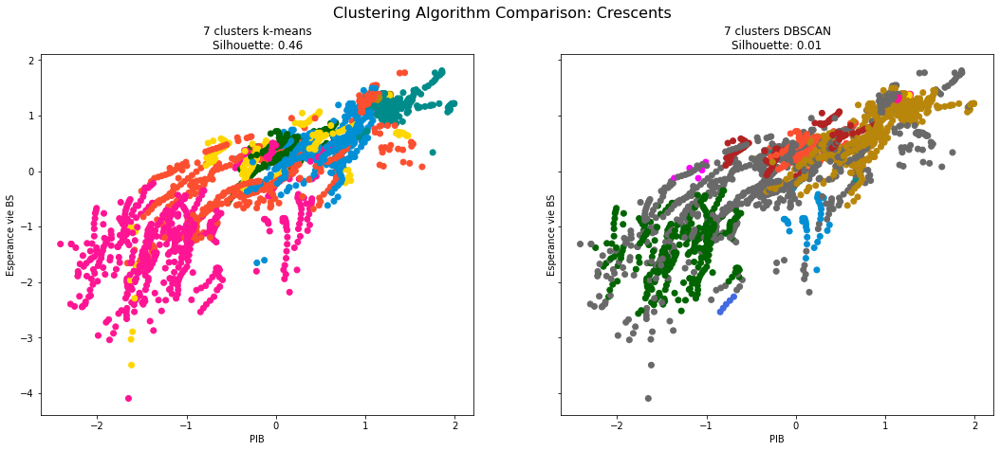

8 clusters : kmeans_silhouette = 0.43 <> dbscan_silhouette = 0.08


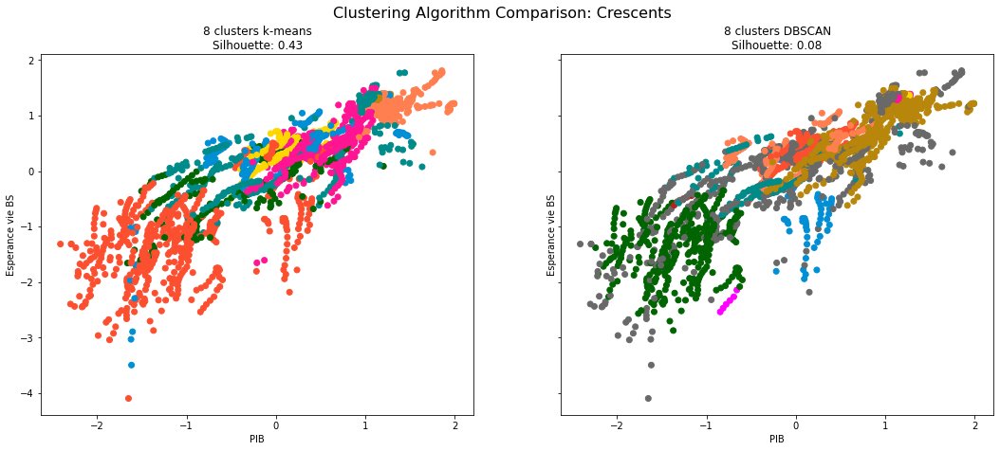

9 clusters : kmeans_silhouette = 0.43 <> dbscan_silhouette = 0.19


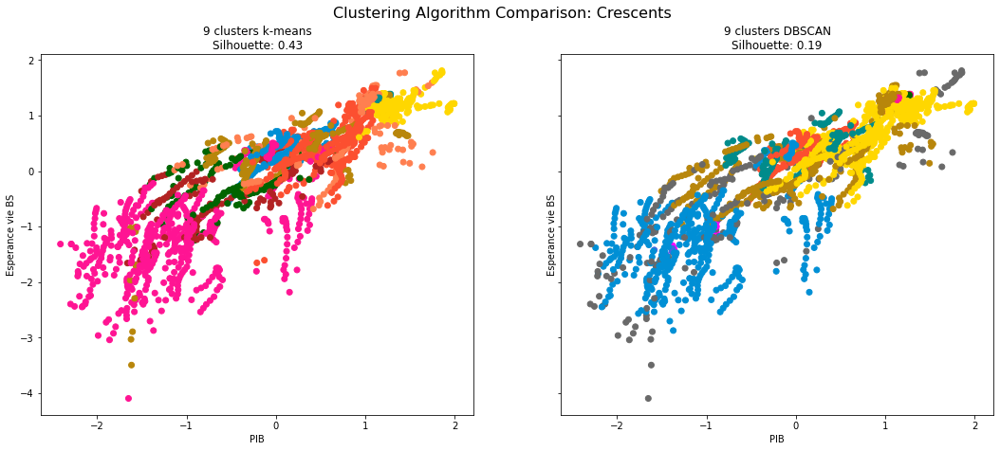

In [102]:
draw_kmeans_and_DBSCAN_comparison(X_scale, nb_clusters, features_column_name=["PIB", "Esperance vie BS"], verbose=verbose)

<div style="display: flex; background-color: deeppink;" >

##### Comparaison entre DBSCAN et Kmean
</div>

In [103]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import adjusted_rand_score

In [109]:
n_cluster = 3
# Instantiate k-means and dbscan algorithms
kmeans = KMeans(n_clusters=n_cluster)
dbscan = DBSCAN(eps=0.19)

# Fit the algorithms to the features
kmeans.fit(X_scale)
dbscan.fit(X_scale)

ari_kmeans = adjusted_rand_score(df_complete_no_nan["score"], kmeans.labels_)
ari_dbscan = adjusted_rand_score(df_complete_no_nan["score"], dbscan.labels_)

print(f"ari_kmeans = {round(ari_kmeans, 2)}")
print(f"ari_dbscan = {round(ari_dbscan, 2)}")

ari_kmeans = 0.0
ari_dbscan = 0.0


C:\Program Files\Python39\lib\site-packages\sklearn\metrics\cluster\_supervised.py:65: UserWarning:

Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target

C:\Program Files\Python39\lib\site-packages\sklearn\metrics\cluster\_supervised.py:65: UserWarning:

Clustering metrics expects discrete values but received continuous values for label, and binary values for target



> The ARI output values range between -1 and 1. A score close to 0.0 indicates random assignments, and a score close to 1 indicates perfectly labeled clusters.

Cette méthode ne semble pas applicable à notre dataset

<div style="display: flex; background-color: Green; padding: 7px;" >

### 4.2. Modélisation
</div>

In [110]:
n_clusters=3
n_init=10
max_iter=300

In [111]:
kmeans = KMeans(
    init="random",
    n_clusters=n_clusters,
    n_init=n_init,
    max_iter=max_iter,
    random_state=random_state
)
kmeans.fit(df_numeric_no_nan)
# The lowest SSE value
km_inertia = kmeans.inertia_
print(f"Interie : {round(km_inertia,2)} - The lowest SSE value")
km_clust_labels = kmeans.predict(df_numeric_no_nan)
print(f"km_clust_labels = {km_clust_labels.shape} ==> {df_complete_no_nan.shape}")
df_no_nan_kmeans = df_complete_no_nan.copy()
df_no_nan_kmeans["kmeans_cluster"] = km_clust_labels
print(f"df_no_nan_kmeans = {df_no_nan_kmeans.shape}")
km_centroids = kmeans.cluster_centers_
print(f"km_centroids = {km_centroids.shape}")
df_no_nan_kmeans.head()

Interie : 54577.88 - The lowest SSE value
km_clust_labels = (1899,) ==> (1899, 21)
df_no_nan_kmeans = (1899, 22)
km_centroids = (3, 15)


,country_official,country,continent_code,continent_encode,year,score,PIB,Soutien,Esperance vie BS,Liberte des choix de vie,...,Regional indicator,alpha3,alpha2,continent_code_AF,continent_code_AS,continent_code_EU,continent_code_NA,continent_code_OC,continent_code_SA,kmeans_cluster
3,Arab Republic of Egypt,Egypt,AF,0,2009,5.066,9.213,0.744,59.94,0.611,...,Middle East and North Africa,EGY,EG,1.0,0.0,0.0,0.0,0.0,0.0,1
4,Arab Republic of Egypt,Egypt,AF,0,2010,4.669,9.244,0.769,60.00,0.486,...,Middle East and North Africa,EGY,EG,1.0,0.0,0.0,0.0,0.0,0.0,1
5,Arab Republic of Egypt,Egypt,AF,0,2011,4.174,9.240,0.753,60.16,0.590,...,Middle East and North Africa,EGY,EG,1.0,0.0,0.0,0.0,0.0,0.0,1
6,Arab Republic of Egypt,Egypt,AF,0,2012,4.204,9.240,0.737,60.32,0.452,...,Middle East and North Africa,EGY,EG,1.0,0.0,0.0,0.0,0.0,0.0,1
7,Arab Republic of Egypt,Egypt,AF,0,2013,3.559,9.239,0.675,60.48,0.474,...,Middle East and North Africa,EGY,EG,1.0,0.0,0.0,0.0,0.0,0.0,1


In [112]:
df_no_nan_kmeans["kmeans_cluster"].value_counts()

2    712
1    633
0    554
Name: kmeans_cluster, dtype: int64

<div style="display: flex; background-color: indigo;" >

#### 4.2.1. Visualisation 3D
</div>

In [114]:
draw_kmeans_features_3d(df=df_no_nan_kmeans, features = ['PIB',"Soutien" ,'Esperance vie BS'], verbose=verbose)

In [115]:
draw_kmeans_features_3d(df=df_no_nan_kmeans, features = ['Corruption',"PIB" ,'Soutien'], verbose=verbose)

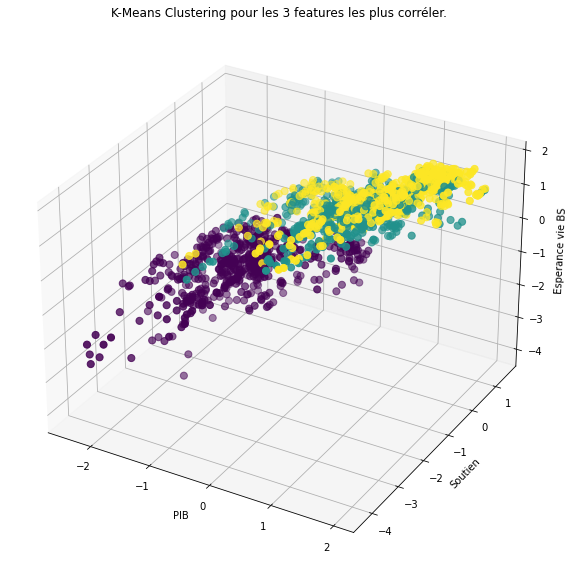

In [198]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_scale['PIB'],X_scale['Soutien'], X_scale['Esperance vie BS'],
                     c=df_no_nan_kmeans["kmeans_cluster"],s=50)
ax.set_title('K-Means Clustering pour les 3 features les plus corréler.')
ax.set_xlabel('PIB')
ax.set_ylabel('Soutien')
ax.set_zlabel('Esperance vie BS')
# plt.colorbar(scatter)
plt.show()

<div style="display: flex; background-color: indigo;" >

#### 4.2.2. Visualisation via ACP avec Centroïd
</div>

In [116]:
def get_pca_x_reduce(X_scale,n_components=2, verbose=0):
    # calculer les composantes principales
    pca = decomposition.PCA(n_components=n_components)
    X_reduced = pca.fit_transform(X_scale)
    X_reduceddf = pd.DataFrame(x_projeected, index=X_scale.index, columns=["F"+str(i+1) for i in range(n_components)])
    return pca, X_reduced, X_reduceddf

In [ ]:
pca, X_reduced, X_reduceddf = get_pca_x_reduce(X_scale, n_components=2, verbose=verbose)

In [216]:
# The number of iterations required to converge
kmeans.n_iter_

13

In [217]:
kmeans.labels_[:5]

array([1, 1, 1, 1, 1])

<div style="display: flex; background-color: Green; padding: 7px;" >

### 4.3. Pipeline
</div>

In [ ]:
import tarfile
import urllib

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, adjusted_rand_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder, MinMaxScaler

In [ ]:
preprocessor = Pipeline(
    [
        ("scaler", StandardScaler()),
        ("pca", PCA(n_components=3, random_state=random_state)),
    ]
)

In [ ]:
clusterer = Pipeline(
   [
       ("kmeans",
           KMeans(
               n_clusters=n_clusters,
               init="k-means++",
               n_init=n_init,
               max_iter=max_iter,
               random_state=random_state,
           ),
       ),
   ]
)

In [ ]:
pipe = Pipeline(
    [
        ("preprocessor", preprocessor),
        ("clusterer", clusterer)
    ]
)

In [ ]:
pipe.fit(df_completed)

In [ ]:
preprocessed_data = pipe["preprocessor"].transform(df_completed)

In [ ]:
predicted_labels = pipe["clusterer"]["kmeans"].labels_

In [ ]:
silhouette_score(preprocessed_data, predicted_labels)

In [ ]:
# adjusted_rand_score(true_labels, predicted_labels)

In [ ]:
pcadf = pd.DataFrame(
    pipe["preprocessor"].transform(df_completed),
    columns=["component_1", "component_2"],
)

pcadf["predicted_cluster"] = pipe["clusterer"]["kmeans"].labels_

plt.style.use("fivethirtyeight")
plt.figure(figsize=(8, 8))

scat = sns.scatterplot(
    "component_1",
    "component_2",
    s=50,
    data=pcadf,
    hue="predicted_cluster",
    palette="Set2",
)

scat.set_title(
    "Clustering results from TCGA Pan-Cancer\nGene Expression Data"
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)

plt.show()

<div style="display: flex; background-color: Green; padding: 7px;" >

### Tuning a K-Means Clustering Pipeline
</div>

In [ ]:
# Empty lists to hold evaluation metrics
silhouette_scores = []
ari_scores = []
for n in range(2, 11):
    # This set the number of components for pca,
    # but leaves other steps unchanged
    pipe["preprocessor"]["pca"].n_components = n
    pipe.fit(df_completed)

    silhouette_coef = silhouette_score(
        pipe["preprocessor"].transform(df_completed),
        pipe["clusterer"]["kmeans"].labels_,
    )
    ari = adjusted_rand_score(
        true_labels,
        pipe["clusterer"]["kmeans"].labels_,
    )

    # Add metrics to their lists
    silhouette_scores.append(silhouette_coef)
    ari_scores.append(ari)

In [ ]:
plt.style.use("fivethirtyeight")
plt.figure(figsize=(6, 6))
plt.plot(
    range(2, 11),
    silhouette_scores,
    c="#008fd5",
    label="Silhouette Coefficient",
)
plt.plot(range(2, 11), ari_scores, c="#fc4f30", label="ARI")

plt.xlabel("n_components")
plt.legend()
plt.title("Clustering Performance as a Function of n_components")
plt.tight_layout()
plt.show()

<div style="display: flex; background-color: Blue; padding: 15px;" >

## Annexes
</div>

In [ ]:
just to fail

<div style="display: flex; background-color: Green; padding: 7px;" >

### Titre 2
</div>

<div style="display: flex; background-color: indigo;" >

#### Titre 3
</div>

<div style="display: flex; background-color: Green; padding: 7px;" >

### EDA
</div>

<div style="display: flex; background-color: indigo;" >

#### 3.1.4. Paiplot de la DF
</div>

In [ ]:
# pour éviter de lancer la génération des paiplot par erreur
Just to fail

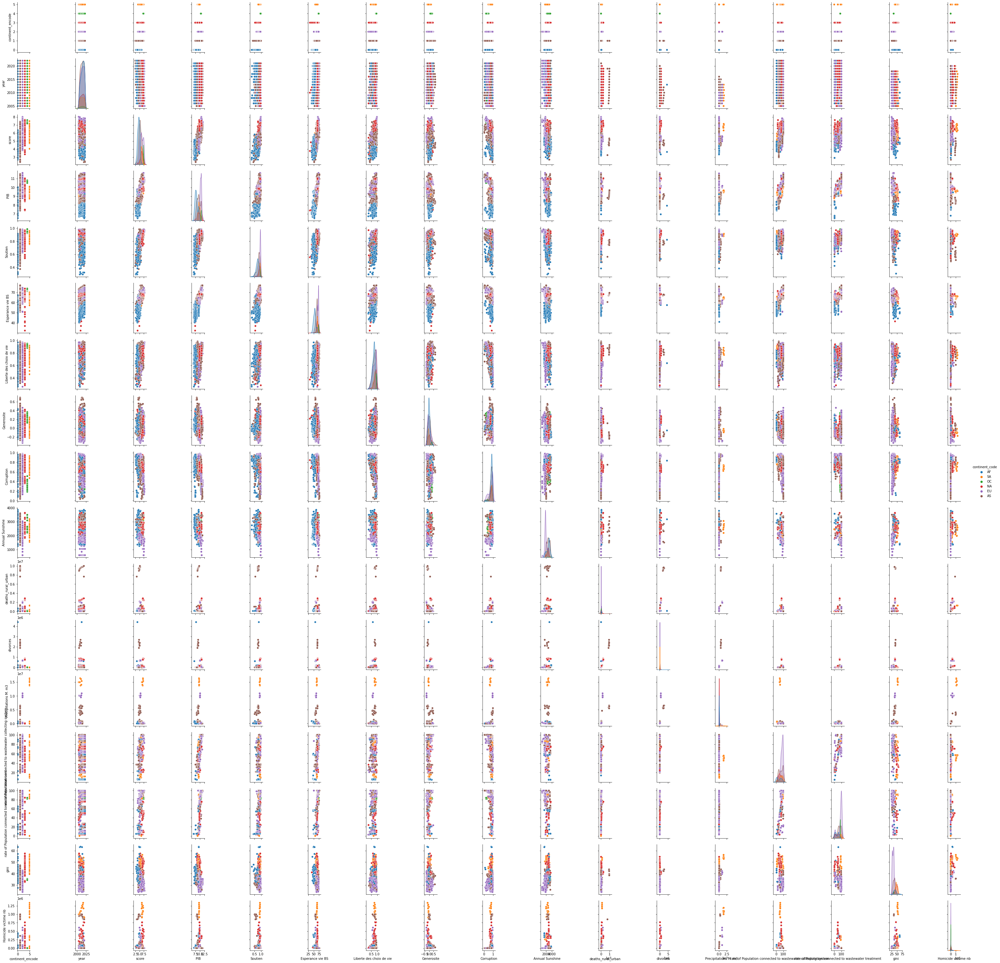

In [ ]:
sns.pairplot(df_completed[['country_official', 'country', 'continent_code', 'continent_encode',
       'year', 'score', 'PIB', 'Soutien', 'Esperance vie BS',
       'Liberte des choix de vie', 'Generosite', 'Corruption',
       'Annual Sunshine', 'deaths_rural_urban', 'divorces',
       'Precipitations M. m3',
       'rate of Population connected to wastewater collecting system',
       'rate of Population connected to wastewater treatment', 'gini',
       'Homicide victime nb']], hue='continent_code')
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.show()

In [ ]:
fig = px.line(x=nb_clusters, y=distortions,markers=True, title="Distortions by elbow method")
fig.update_layout(
    xaxis_title="Nb clusters",
    yaxis_title="Distortions",
)
fig.update_layout(margin=dict(l=10, r=20, t=40, b=10))
fig.update_xaxes(dtick=1)
fig.show()